In [1]:
import os
import random
from pathlib import Path
from collections import Counter
from typing import List, Tuple, Dict

In [2]:
from PIL import Image, ImageOps
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm

In [3]:
import torchvision.transforms as T
from torchvision.utils import make_grid

In [4]:
plt.rcParams['figure.figsize'] = (10, 6)
plt.rcParams['image.interpolation'] = 'nearest'
plt.rcParams['image.cmap'] = 'viridis'

In [5]:
DATASET_PATHS = {
    "DIV2K": "./datasets/DIV2K/train",       # folder of high-res images
    "Flickr2K": "./datasets/Flickr2K",       # folder of images
    "BSD300": "./datasets/BSD300/images/train",
    "PristineGray": "./datasets/pristine_gray",
    "PristineColor": "./datasets/pristine_color",
    "Places365": "./datasets/places365/train",
    # CIFAR-10 handled separately via torchvision
}

In [ ]:
DATASET_PATHS = {k: Path(v) for k, v in DATASET_PATHS.items()}

In [ ]:
IMG_EXTS = {'.jpg', '.jpeg', '.png', '.bmp', '.tiff', '.tif'}

In [ ]:
def list_images(folder: Path) -> List[Path]:
    """Return list of image files in folder (recursively)."""
    if not folder.exists():
        return []
    return [p for p in folder.rglob('*') if p.suffix.lower() in IMG_EXTS]

In [ ]:
def safe_open_image(p: Path) -> Image.Image:
    """Open image with PIL safely; returns None if corrupt."""
    try:
        img = Image.open(p).convert('RGB')
        return img
    except Exception as e:
        # optionally log the error
        # print(f"Failed to open {p}: {e}")
        return None

In [ ]:
def add_gaussian_noise(img: Image.Image, sigma: float = 25.0) -> Image.Image:
    arr = np.asarray(img).astype(np.float32)
    noise = np.random.randn(*arr.shape).astype(np.float32) * sigma
    arr = np.clip(arr + noise, 0, 255).astype(np.uint8)
    return Image.fromarray(arr)

In [ ]:
def downscale(img: Image.Image, scale: int = 4, resample=Image.BICUBIC) -> Image.Image:
    w, h = img.size
    small = img.resize((w // scale, h // scale), resample=resample)
    return small.resize((w, h), resample=resample)

In [ ]:
def make_random_mask(img: Image.Image, hole_ratio=0.2) -> Image.Image:
    """Binary mask with random rectangular holes (for inpainting visualization)."""
    w, h = img.size
    mask = Image.new('L', (w, h), 255)  # white = keep
    draw = Image.fromarray(np.array(mask))
    arr = np.array(mask)
    # add several random rectangles
    n_holes = random.randint(1, 6)
    for _ in range(n_holes):
        ww = random.randint(int(0.05*w), int(0.4*w))
        hh = random.randint(int(0.05*h), int(0.4*h))
        x = random.randint(0, max(0, w - ww))
        y = random.randint(0, max(0, h - hh))
        arr[y:y+hh, x:x+ww] = 0
    return Image.fromarray(arr)

In [ ]:
dataset_index: Dict[str, List[Path]] = {}

In [ ]:
for name, p in DATASET_PATHS.items():
    imgs = list_images(p)
    dataset_index[name] = imgs
    print(f"{name}: {len(imgs)} images, path exists: {p.exists()}")

In [ ]:
from torchvision.datasets import CIFAR10

In [ ]:
cifar_root = "./datasets/cifar10"

In [ ]:
cifar_train = CIFAR10(root=cifar_root, train=True, download=True)
cifar_test = CIFAR10(root=cifar_root, train=False, download=True)

In [ ]:
print(f"CIFAR-10: train {len(cifar_train)}, test {len(cifar_test)}")
dataset_index["CIFAR10"] = []

In [ ]:
def show_image_grid(images: List[Image.Image], titles: List[str] = None, nrow: int = 4, figsize=(12, 8)):
    """Display a grid of PIL images."""
    if len(images) == 0:
        print("No images to show.")
        return
    # convert to tensors for make_grid convenience
    import torch
    to_tensor = T.ToTensor()
    tensors = [to_tensor(im) for im in images]
    grid = make_grid(tensors, nrow=nrow, pad_value=255)
    plt.figure(figsize=figsize)
    plt.axis('off')
    plt.imshow(np.transpose(grid.numpy(), (1, 2, 0)))
    if titles:
        plt.title(" | ".join(titles))
    plt.show()

In [ ]:
sample_name = None
for k in ["DIV2K", "Flickr2K", "BSD300", "Places365"]:
    if dataset_index.get(k):
        sample_name = k
        break

if sample_name:
    img_paths = dataset_index[sample_name]
    sample_paths = random.sample(img_paths, min(8, len(img_paths)))
    sample_images = [safe_open_image(p).resize((256, 256)) for p in sample_paths]
    show_image_grid(sample_images, nrow=4)
else:
    print("No large dataset found in DATASET_PATHS. Update the paths to view samples.")

In [ ]:
def dataset_image_size_stats(img_paths: List[Path], max_samples: int = 2000):
    widths, heights = [], []
    corrupt = []
    it = img_paths if len(img_paths) <= max_samples else random.sample(img_paths, max_samples)
    for p in tqdm(it, desc="scanning images"):
        img = safe_open_image(p)
        if img is None:
            corrupt.append(p)
            continue
        w, h = img.size
        widths.append(w)
        heights.append(h)
    widths = np.array(widths) if widths else np.array([])
    heights = np.array(heights) if heights else np.array([])
    stats = {
        'count_total': len(img_paths),
        'scanned': len(widths),
        'corrupt_or_unreadable': len(corrupt),
        'width_mean': float(widths.mean()) if widths.size else None,
        'height_mean': float(heights.mean()) if heights.size else None,
        'width_median': int(np.median(widths)) if widths.size else None,
        'height_median': int(np.median(heights)) if heights.size else None,
        'width_std': float(widths.std()) if widths.size else None,
        'height_std': float(heights.std()) if heights.size else None,
        'aspect_ratio_counts': Counter((w//32, h//32) for w, h in zip(widths, heights)) if widths.size else None,
        'corrupt_samples': corrupt[:10]
    }
    return stats

In [ ]:
for name, paths in dataset_index.items():
    if name == "CIFAR10":
        continue
    if len(paths) == 0:
        print(f"{name}: no images found (skipping).")
        continue
    print(f"\n--- {name} ---")
    stats = dataset_image_size_stats(paths, max_samples=1000)
    for k, v in stats.items():
        if k == 'corrupt_samples' and v:
            print(k + ':', [str(x.name) for x in v])
        else:
            print(f"{k}: {v}")

In [ ]:
def compute_channel_mean_std(img_paths: List[Path], max_images: int = 2000):
    """
    Compute per-channel mean and std in range [0,1].
    NOTE: iterates through images; for large datasets set max_images to a reasonable value.
    """
    sample_paths = img_paths if len(img_paths) <= max_images else random.sample(img_paths, max_images)
    sum_c = np.zeros(3, dtype=np.float64)
    sum_sq_c = np.zeros(3, dtype=np.float64)
    n_pixels = 0
    for p in tqdm(sample_paths, desc="computing mean/std"):
        img = safe_open_image(p)
        if img is None:
            continue
        arr = np.asarray(img).astype(np.float32) / 255.0
        h, w, c = arr.shape
        pixels = h * w
        # sum over HxW
        sum_c += arr.reshape(-1, 3).sum(axis=0)
        sum_sq_c += (arr.reshape(-1, 3) ** 2).sum(axis=0)
        n_pixels += pixels
    if n_pixels == 0:
        return None
    mean = sum_c / n_pixels
    var = (sum_sq_c / n_pixels) - (mean ** 2)
    std = np.sqrt(np.maximum(var, 0.0))
    return {'mean': mean.tolist(), 'std': std.tolist(), 'n_pixels': int(n_pixels)}

In [ ]:
for name in ["DIV2K", "Flickr2K", "BSD300"]:
    paths = dataset_index.get(name, [])
    if len(paths) == 0:
        print(f"{name}: no samples (skipping mean/std).")
        continue
    print(f"\n{name} mean/std (sampled):")
    print(compute_channel_mean_std(paths, max_images=500))

In [ ]:
cifar = CIFAR10(root=cifar_root, train=True, download=False)
arr = cifar.data.astype(np.float32) / 255.0
arr = arr.astype(np.float32) / 255.0
mean = arr.reshape(-1, 3).mean(axis=0)
std = arr.reshape(-1, 3).std(axis=0)
print(f"\nCIFAR-10 approx mean={mean.tolist()}, std={std.tolist()}")

In [ ]:
def plot_color_histogram(img: Image.Image, ax=None, title=None):
    arr = np.asarray(img).astype(np.float32).reshape(-1, 3) / 255.0
    if ax is None:
        fig, ax = plt.subplots(figsize=(6,3))
    ax.hist(arr[:, 0], bins=50, alpha=0.5, label='R')
    ax.hist(arr[:, 1], bins=50, alpha=0.5, label='G')
    ax.hist(arr[:, 2], bins=50, alpha=0.5, label='B')
    ax.legend()
    if title:
        ax.set_title(title)

In [ ]:
for name in ["DIV2K", "Places365", "BSD300"]:
    paths = dataset_index.get(name, [])
    if not paths:
        continue
    p = random.choice(paths)
    img = safe_open_image(p).resize((256,256))
    fig, ax = plt.subplots(1,1,figsize=(6,3))
    plot_color_histogram(img, ax=ax, title=f"{name} sample: {p.name}")
    plt.show()
    break

In [ ]:
def show_degradation_examples(img: Image.Image, size=(256,256)):
    img = img.resize(size)
    noisy = add_gaussian_noise(img, sigma=20.0)
    down = downscale(img, scale=4)
    gray = ImageOps.grayscale(img).convert('RGB')
    mask = make_random_mask(img)
    # apply mask to image (holes shown as black)
    masked = Image.fromarray(np.asarray(img) * (np.asarray(mask)[:, :, None] // 255))
    images = [img, noisy, down, gray, masked]
    titles = ['Original', 'Gaussian Noise', 'Downscaled (x4 upsample->hr)', 'Grayscale (colorization)', 'Masked (inpainting)']
    show_image_grid([im.resize((256,256)) for im in images], titles=titles, nrow=3, figsize=(12,6))


In [ ]:
sample_img = None
for name in ["DIV2K", "Flickr2K", "BSD300", "Places365", "PristineGray"]:
    if dataset_index.get(name):
        sample_img = safe_open_image(random.choice(dataset_index[name]))
        break

In [ ]:
if sample_img:
    show_degradation_examples(sample_img)
else:
    print("No sample available. Update DATASET_PATHS to some dataset directory to visualize degradations.")

In [ ]:
import json

In [ ]:
report = {}
for name, paths in dataset_index.items():
    if name == "CIFAR10":
        report[name] = {'count': len(cifar_train) + len(cifar_test), 'notes': 'via torchvision CIFAR10'}
        continue
    if len(paths) == 0:
        report[name] = {'count': 0, 'notes': 'not found / path not set'}
        continue
    stats = dataset_image_size_stats(paths, max_samples=1000)
    ms = compute_channel_mean_std(paths, max_images=500)
    report[name] = {'count': len(paths), 'size_stats': {k: v for k, v in stats.items() if k != 'corrupt_samples'}, 'mean_std': ms}


In [ ]:
def make_json_safe(obj):
    # numpy scalar → Python scalar
    if isinstance(obj, np.generic):
        return obj.item()

    # Counter or dict: stringify keys, clean values
    if isinstance(obj, (Counter, dict)):
        return {str(k): make_json_safe(v) for k, v in obj.items()}

    # list/tuple/set → list
    if isinstance(obj, (list, tuple, set)):
        return [make_json_safe(x) for x in obj]

    # basic types are fine
    return obj

In [ ]:
safe_report = make_json_safe(report)

In [ ]:
with open('dataset_analysis_report.json', 'w') as f:
    json.dump(safe_report, f, indent=2)

print("Saved dataset_analysis_report.json")

# Preprocessing

In [ ]:
from concurrent.futures import ThreadPoolExecutor
import os
from pathlib import Path
from PIL import Image, ImageOps
import numpy as np
from tqdm.notebook import tqdm
import time

In [ ]:
PATCH_SIZE = 256
PATCH_DIR = Path("patches")
PATCH_DIR.mkdir(exist_ok=True)

In [ ]:
SAFE_DATASET_PATHS = {
    k: v for k, v in DATASET_PATHS.items()
    if "Places365" not in k
}

In [ ]:
def safe_open(p: Path):
    try:
        return Image.open(p).convert("RGB")
    except:
        return None

In [ ]:
def extract_patches_worker(path):
    img = safe_open(path)
    if img is None:
        return []

    w, h = img.size
    patches = []

    # Pad if smaller
    if w < PATCH_SIZE or h < PATCH_SIZE:
        img = ImageOps.pad(img, (max(w, PATCH_SIZE), max(h, PATCH_SIZE)))
        w, h = img.size

    # Non-overlapping patches
    for top in range(0, h - PATCH_SIZE + 1, PATCH_SIZE):
        for left in range(0, w - PATCH_SIZE + 1, PATCH_SIZE):
            patch = img.crop((left, top, left + PATCH_SIZE, top + PATCH_SIZE))
            patches.append(np.asarray(patch).astype(np.uint8))

    return patches

In [ ]:
def run_patch_extraction(paths, patch_dir):
    print(f"Saving patches to: {patch_dir.resolve()}")

    counter = 0
    with ThreadPoolExecutor(max_workers=4) as ex:
        for patch_list in tqdm(ex.map(extract_patches_worker, paths),
                               total=len(paths)):
            for p in patch_list:
                Image.fromarray(p).save(patch_dir / f"{counter:08d}.png")
                counter += 1

    print(f"\nExtracted {counter} patches.")
    return counter

In [ ]:
image_paths = []
for name, folder in SAFE_DATASET_PATHS.items():
    paths = list_images(folder)
    print(f"{name}: {len(paths)} images")
    image_paths.extend(paths)

In [ ]:
print(f"\nTotal HR images used: {len(image_paths)}")

In [ ]:
start = time.time()
patch_count = run_patch_extraction(image_paths, PATCH_DIR)
print(f"Done in {time.time() - start:.2f} seconds")

In [ ]:
import lmdb
import msgpack
import msgpack_numpy as m
m.patch()

In [ ]:
import numpy as np
from PIL import Image, ImageDraw, ImageFilter
import cv2
from tqdm.notebook import tqdm
from pathlib import Path
import time

In [ ]:
PATCH_DIR = Path("patches")
LMDB_DIR = Path("lmdb_final")
LMDB_DIR.mkdir(exist_ok=True)

In [ ]:
PATCH_SIZE = 256
MAP_SIZE = 1 << 40

In [ ]:
def make_lr(hr_img, scale):
    return hr_img.resize((PATCH_SIZE // scale, PATCH_SIZE // scale), Image.BICUBIC)

In [ ]:
def add_noise(img, sigma):
    arr = np.array(img).astype(np.float32)
    noise = np.random.randn(*arr.shape) * sigma
    arr = np.clip(arr + noise, 0, 255).astype(np.uint8)
    return Image.fromarray(arr)

In [ ]:
def rgb_to_lab_arrays(img):
    arr = np.array(img)[..., ::-1]  # RGB→BGR
    lab = cv2.cvtColor(arr, cv2.COLOR_BGR2LAB)
    return lab[...,0].astype(np.uint8), lab[...,1:].astype(np.uint8)  # L, ab

In [ ]:
def rect_mask():
    mask = np.ones((PATCH_SIZE, PATCH_SIZE), dtype=np.uint8) * 255
    for _ in range(np.random.randint(1,4)):
        w = np.random.randint(40,160)
        h = np.random.randint(40,160)
        x = np.random.randint(0, PATCH_SIZE - w)
        y = np.random.randint(0, PATCH_SIZE - h)
        mask[y:y+h, x:x+w] = 0
    return mask

In [ ]:
def irregular_mask():
    mask = Image.new("L", (PATCH_SIZE, PATCH_SIZE), 255)
    draw = ImageDraw.Draw(mask)
    for _ in range(np.random.randint(6,12)):
        x1, y1 = np.random.randint(0, PATCH_SIZE, 2)
        x2 = x1 + np.random.randint(-60, 60)
        y2 = y1 + np.random.randint(-60, 60)
        draw.line([x1, y1, x2, y2], fill=0, width=np.random.randint(8, 30))
    mask = mask.filter(ImageFilter.GaussianBlur(3))
    arr = np.array(mask)
    arr = (arr > 128).astype(np.uint8) * 255
    return arr

In [ ]:
def build_lmdb(patch_dir, lmdb_dir):
    env = lmdb.open(str(lmdb_dir / "dataset.lmdb"), map_size=MAP_SIZE)
    txn = env.begin(write=True)
    
    patch_paths = sorted(patch_dir.glob("*.png"))
    print(f"Building LMDB from {len(patch_paths)} patches…")

    counter = 0
    for path in tqdm(patch_paths):
        hr = Image.open(path).convert("RGB")

        # Super resolution
        lr2 = make_lr(hr, 2)
        lr4 = make_lr(hr, 4)

        # Denoising
        n15 = add_noise(hr, 15)
        n25 = add_noise(hr, 25)
        n50 = add_noise(hr, 50)

        # Colorization LAB
        L, ab = rgb_to_lab_arrays(hr)

        # Inpainting
        m_rect = rect_mask()
        m_irr  = irregular_mask()
        masked_rect = np.array(hr) * (m_rect[...,None]//255)
        masked_irr  = np.array(hr) * (m_irr[...,None]//255)

        record = {
            "hr": np.array(hr, dtype=np.uint8),

            "lr_x2": np.array(lr2, dtype=np.uint8),
            "lr_x4": np.array(lr4, dtype=np.uint8),

            "noisy_15": np.array(n15, dtype=np.uint8),
            "noisy_25": np.array(n25, dtype=np.uint8),
            "noisy_50": np.array(n50, dtype=np.uint8),

            "L": L,
            "ab": ab,

            "mask_rect": m_rect,
            "masked_rect": masked_rect,

            "mask_irregular": m_irr,
            "masked_irregular": masked_irr,
        }

        key = f"{counter:08d}".encode("ascii")
        txn.put(key, msgpack.packb(record, use_bin_type=True))

        counter += 1
        if counter % 500 == 0:
            txn.commit()
            txn = env.begin(write=True)

    txn.commit()
    env.close()
    print(f"LMDB complete — {counter} entries.")

    return counter

In [ ]:
start = time.time()
count = build_lmdb(PATCH_DIR, LMDB_DIR)
print(f"Done. {count} records written.")
print(f"Time: {time.time() - start:.2f} sec")

In [19]:
import lmdb
import msgpack
import msgpack_numpy as m
m.patch()

In [20]:
from pathlib import Path
import numpy as np
from typing import List

In [21]:
import torch
from torch.utils.data import Dataset, DataLoader

In [22]:
LMDB_DIR = Path("lmdb_final")
LMDB_PATH = LMDB_DIR / "dataset.lmdb"

In [23]:
DEVICE = "mps" if torch.backends.mps.is_available() else "cpu"
print("Using device:", DEVICE)
print("LMDB path:", LMDB_PATH)

Using device: mps
LMDB path: lmdb_final/dataset.lmdb


In [24]:
class BaseLMDBDataset(Dataset):
    def __init__(self, lmdb_path: Path):
        super().__init__()
        self.lmdb_path = str(lmdb_path)
        self.env = lmdb.open(
            self.lmdb_path,
            readonly=True,
            lock=False,
            readahead=True,
            meminit=False,
        )
        # collect keys once
        with self.env.begin(write=False) as txn:
            self.keys: List[bytes] = [k for k, _ in txn.cursor()]
        print(f"{self.__class__.__name__}: found {len(self.keys)} entries in {self.lmdb_path}")

    def __len__(self):
        return len(self.keys)

    def _get_record(self, index: int):
        key = self.keys[index]
        with self.env.begin(write=False) as txn:
            value = txn.get(key)
        if value is None:
            raise IndexError(f"No record found for key index {index} (key={key})")
        obj = msgpack.unpackb(value, raw=False)
        return obj

In [25]:
class SuperResolutionDatasetX2(BaseLMDBDataset):
    def __getitem__(self, idx):
        rec = self._get_record(idx)
        hr = rec["hr"]          # HxWx3 uint8
        lr = rec["lr_x2"]       # (H/2)x(W/2)x3 uint8

        # convert to float tensors in [0,1]
        hr_t = torch.from_numpy(hr).permute(2, 0, 1).float() / 255.0
        lr_t = torch.from_numpy(lr).permute(2, 0, 1).float() / 255.0

        return {
            "lr": lr_t,
            "hr": hr_t,
            "scale": 2,
        }

In [26]:
class SuperResolutionDatasetX4(BaseLMDBDataset):
    def __getitem__(self, idx):
        rec = self._get_record(idx)
        hr = rec["hr"]          # HxWx3 uint8
        lr = rec["lr_x4"]       # (H/4)x(W/4)x3 uint8

        hr_t = torch.from_numpy(hr).permute(2, 0, 1).float() / 255.0
        lr_t = torch.from_numpy(lr).permute(2, 0, 1).float() / 255.0

        return {
            "lr": lr_t,
            "hr": hr_t,
            "scale": 4,
        }

In [27]:
sr2_ds = SuperResolutionDatasetX2(LMDB_PATH)
sr4_ds = SuperResolutionDatasetX4(LMDB_PATH)

SuperResolutionDatasetX2: found 131277 entries in lmdb_final/dataset.lmdb
SuperResolutionDatasetX4: found 131277 entries in lmdb_final/dataset.lmdb


In [28]:
print("SR x2 sample shapes:", sr2_ds[0]["lr"].shape, sr2_ds[0]["hr"].shape)
print("SR x4 sample shapes:", sr4_ds[0]["lr"].shape, sr4_ds[0]["hr"].shape)

SR x2 sample shapes: torch.Size([3, 128, 128]) torch.Size([3, 256, 256])
SR x4 sample shapes: torch.Size([3, 64, 64]) torch.Size([3, 256, 256])


/var/folders/d9/34q0n1js31x765w00t009x6c0000gn/T/ipykernel_72650/1912551176.py:8: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at /Users/runner/work/pytorch/pytorch/pytorch/torch/csrc/utils/tensor_numpy.cpp:212.)
  hr_t = torch.from_numpy(hr).permute(2, 0, 1).float() / 255.0


In [29]:
class DenoiseDataset(BaseLMDBDataset):
    def __init__(self, lmdb_path: Path, noise_levels=(15, 25, 50)):
        super().__init__(lmdb_path)
        self.noise_levels = noise_levels

    def __getitem__(self, idx):
        rec = self._get_record(idx)
        hr = rec["hr"]   # clean
        # randomly pick which noisy version to use
        level = np.random.choice(self.noise_levels)
        if level == 15:
            noisy = rec["noisy_15"]
        elif level == 25:
            noisy = rec["noisy_25"]
        else:
            noisy = rec["noisy_50"]

        hr_t = torch.from_numpy(hr).permute(2, 0, 1).float() / 255.0
        noisy_t = torch.from_numpy(noisy).permute(2, 0, 1).float() / 255.0

        return {
            "noisy": noisy_t,
            "clean": hr_t,
            "sigma": float(level),
        }

In [30]:
dn_ds = DenoiseDataset(LMDB_PATH)
sample = dn_ds[0]
print("Denoise shapes noisy/clean:", sample["noisy"].shape, sample["clean"].shape, "sigma:", sample["sigma"])

DenoiseDataset: found 131277 entries in lmdb_final/dataset.lmdb
Denoise shapes noisy/clean: torch.Size([3, 256, 256]) torch.Size([3, 256, 256]) sigma: 15.0


In [31]:
class ColorizationDataset(BaseLMDBDataset):
    def __getitem__(self, idx):
        rec = self._get_record(idx)
        L = rec["L"]    # HxW uint8, 0..255
        ab = rec["ab"]  # HxWx2 uint8, original 0..255 (LAB a/b or shifted)

        L_t = torch.from_numpy(L).unsqueeze(0).float() / 255.0  # (1,H,W)

        # convert ab 0..255 -> roughly [-1,1] (centered)
        ab_f = (torch.from_numpy(ab).permute(2, 0, 1).float() - 128.0) / 128.0  # (2,H,W)

        return {
            "L": L_t,
            "ab": ab_f,
        }


In [32]:
col_ds = ColorizationDataset(LMDB_PATH)
col_sample = col_ds[0]
print("Colorization L shape:", col_sample["L"].shape, "ab shape:", col_sample["ab"].shape)

ColorizationDataset: found 131277 entries in lmdb_final/dataset.lmdb
Colorization L shape: torch.Size([1, 256, 256]) ab shape: torch.Size([2, 256, 256])


In [33]:
class InpaintingDataset(BaseLMDBDataset):
    def __getitem__(self, idx):
        rec = self._get_record(idx)
        hr = rec["hr"]  # GT image

        # random choice: rect or irregular
        if np.random.rand() < 0.5:
            masked = rec["masked_rect"]
            mask = rec["mask_rect"]
            mtype = "rect"
        else:
            masked = rec["masked_irregular"]
            mask = rec["mask_irregular"]
            mtype = "irregular"

        hr_t = torch.from_numpy(hr).permute(2, 0, 1).float() / 255.0
        masked_t = torch.from_numpy(masked).permute(2, 0, 1).float() / 255.0

        # mask is HxW uint8 (0 or 255) -> float in {0,1}
        mask_arr = (np.array(mask) > 0).astype(np.float32)
        mask_t = torch.from_numpy(mask_arr).unsqueeze(0)  # (1,H,W)

        return {
            "masked": masked_t,
            "mask": mask_t,
            "gt": hr_t,
            "mask_type": mtype,
        }

In [34]:
inp_ds = InpaintingDataset(LMDB_PATH)
inp_sample = inp_ds[0]
print("Inpaint masked:", inp_sample["masked"].shape,
      "mask:", inp_sample["mask"].shape,
      "gt:", inp_sample["gt"].shape,
      "type:", inp_sample["mask_type"])

InpaintingDataset: found 131277 entries in lmdb_final/dataset.lmdb
Inpaint masked: torch.Size([3, 256, 256]) mask: torch.Size([1, 256, 256]) gt: torch.Size([3, 256, 256]) type: rect


In [35]:
BATCH_SIZE = 8

In [36]:
sr2_loader = DataLoader(
    SuperResolutionDatasetX2(LMDB_PATH),
    batch_size=BATCH_SIZE,
    shuffle=True,
    num_workers=0,   # use 0 or 1 on macOS/Jupyter
    pin_memory=False,
)

SuperResolutionDatasetX2: found 131277 entries in lmdb_final/dataset.lmdb


In [37]:
sr4_loader = DataLoader(
    SuperResolutionDatasetX4(LMDB_PATH),
    batch_size=BATCH_SIZE,
    shuffle=True,
    num_workers=0,
    pin_memory=False,
)

SuperResolutionDatasetX4: found 131277 entries in lmdb_final/dataset.lmdb


In [38]:
dn_loader = DataLoader(
    DenoiseDataset(LMDB_PATH),
    batch_size=BATCH_SIZE,
    shuffle=True,
    num_workers=0,
    pin_memory=False,
)

DenoiseDataset: found 131277 entries in lmdb_final/dataset.lmdb


In [39]:
col_loader = DataLoader(
    ColorizationDataset(LMDB_PATH),
    batch_size=BATCH_SIZE,
    shuffle=True,
    num_workers=0,
    pin_memory=False,
)

ColorizationDataset: found 131277 entries in lmdb_final/dataset.lmdb


In [40]:
inp_loader = DataLoader(
    InpaintingDataset(LMDB_PATH),
    batch_size=BATCH_SIZE,
    shuffle=True,
    num_workers=0,
    pin_memory=False,
)

InpaintingDataset: found 131277 entries in lmdb_final/dataset.lmdb


In [41]:
batch_sr2 = next(iter(sr2_loader))
print("SR x2 batch lr/hr:", batch_sr2["lr"].shape, batch_sr2["hr"].shape)


SR x2 batch lr/hr: torch.Size([8, 3, 128, 128]) torch.Size([8, 3, 256, 256])


In [42]:
batch_dn = next(iter(dn_loader))
print("Denoise batch noisy/clean:", batch_dn["noisy"].shape, batch_dn["clean"].shape)


Denoise batch noisy/clean: torch.Size([8, 3, 256, 256]) torch.Size([8, 3, 256, 256])


In [43]:
batch_col = next(iter(col_loader))
print("Colorization batch L/ab:", batch_col["L"].shape, batch_col["ab"].shape)

Colorization batch L/ab: torch.Size([8, 1, 256, 256]) torch.Size([8, 2, 256, 256])


In [44]:
batch_inp = next(iter(inp_loader))
print("Inpaint batch masked/mask/gt:", batch_inp["masked"].shape,
      batch_inp["mask"].shape,
      batch_inp["gt"].shape)

Inpaint batch masked/mask/gt: torch.Size([8, 3, 256, 256]) torch.Size([8, 1, 256, 256]) torch.Size([8, 3, 256, 256])


# Training models

In [45]:
import os
from pathlib import Path
import math
import time
import numpy as np
import matplotlib.pyplot as plt

In [46]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader

In [47]:
if torch.backends.mps.is_available():
    DEVICE = "mps"
elif torch.cuda.is_available():
    DEVICE = "cuda"
else:
    DEVICE = "cpu"

In [48]:
print("Using device:", DEVICE)

Using device: mps


In [49]:
USE_AMP = False   # you asked for mixed precision
DEVICE_TYPE = "cuda" if DEVICE == "cuda" else ("mps" if DEVICE == "mps" else "cpu")

In [50]:
LMDB_DIR = Path("lmdb_final")
LMDB_PATH = LMDB_DIR / "dataset.lmdb"
CKPT_DIR = Path("checkpoints")
CKPT_DIR.mkdir(exist_ok=True)

In [51]:
BATCH_SIZE = 8
EPOCHS = 5
LR = 1e-4
PREVIEW_INTERVAL = 2    # epochs between visual previews
CKPT_INTERVAL = 2 

In [52]:
class ResidualBlock(nn.Module):
    def __init__(self, channels):
        super().__init__()
        self.conv1 = nn.Conv2d(channels, channels, 3, padding=1)
        self.relu = nn.ReLU(inplace=True)
        self.conv2 = nn.Conv2d(channels, channels, 3, padding=1)

    def forward(self, x):
        out = self.conv1(x)
        out = self.relu(out)
        out = self.conv2(out)
        return x + out * 0.1

In [53]:
class SRNet(nn.Module):
    """
    Very small EDSR-like network.
    Input: LR image (B,3,H,W)
    Output: HR image (B,3,H*scale,W*scale)
    """
    def __init__(self, scale=2, num_feats=64, num_blocks=8):
        super().__init__()
        self.scale = scale
        self.head = nn.Conv2d(3, num_feats, 3, padding=1)

        self.body = nn.Sequential(
            *[ResidualBlock(num_feats) for _ in range(num_blocks)],
            nn.Conv2d(num_feats, num_feats, 3, padding=1),
        )

        # Upsampling via PixelShuffle
        up_layers = []
        s = scale
        for _ in range(int(math.log2(s))):  # scale is 2 or 4 -> log2 is 1 or 2
            up_layers += [
                nn.Conv2d(num_feats, num_feats * 4, 3, padding=1),
                nn.PixelShuffle(2),
                nn.ReLU(inplace=True),
            ]
        self.upsampler = nn.Sequential(*up_layers)
        self.tail = nn.Conv2d(num_feats, 3, 3, padding=1)

    def forward(self, x):
        feat = self.head(x)
        res = self.body(feat)
        feat = feat + res  # long skip
        up = self.upsampler(feat)
        out = self.tail(up)
        return torch.sigmoid(out)

In [54]:
class DnCNN(nn.Module):
    """
    Simple DnCNN-style denoiser.
    """
    def __init__(self, depth=10, num_feats=64, in_channels=3):
        super().__init__()
        layers = [nn.Conv2d(in_channels, num_feats, 3, padding=1), nn.ReLU(inplace=True)]
        for _ in range(depth-2):
            layers += [
                nn.Conv2d(num_feats, num_feats, 3, padding=1),
                nn.BatchNorm2d(num_feats),
                nn.ReLU(inplace=True),
            ]
        layers += [nn.Conv2d(num_feats, in_channels, 3, padding=1)]
        self.net = nn.Sequential(*layers)

    def forward(self, x):
        # residual learning: output = x - noise
        noise = self.net(x)
        return torch.clamp(x - noise, 0.0, 1.0)

In [55]:
class DoubleConv(nn.Module):
    def __init__(self, in_ch, out_ch):
        super().__init__()
        self.block = nn.Sequential(
            nn.Conv2d(in_ch, out_ch, 3, padding=1),
            nn.BatchNorm2d(out_ch),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_ch, out_ch, 3, padding=1),
            nn.BatchNorm2d(out_ch),
            nn.ReLU(inplace=True),
        )

    def forward(self, x):
        return self.block(x)

In [56]:
class ColorizationUNet(nn.Module):
    """
    Lightweight U-Net.
    Input: L channel (B,1,H,W)
    Output: ab channels (B,2,H,W) in roughly [-1,1]
    """
    def __init__(self, base_ch=32):
        super().__init__()
        self.down1 = DoubleConv(1, base_ch)
        self.pool1 = nn.MaxPool2d(2)
        self.down2 = DoubleConv(base_ch, base_ch*2)
        self.pool2 = nn.MaxPool2d(2)

        self.bottleneck = DoubleConv(base_ch*2, base_ch*4)

        self.up2 = nn.ConvTranspose2d(base_ch*4, base_ch*2, 2, stride=2)
        self.conv2 = DoubleConv(base_ch*4, base_ch*2)

        self.up1 = nn.ConvTranspose2d(base_ch*2, base_ch, 2, stride=2)
        self.conv1 = DoubleConv(base_ch*2, base_ch)

        self.out_conv = nn.Conv2d(base_ch, 2, 1)

    def forward(self, x):
        d1 = self.down1(x)
        p1 = self.pool1(d1)

        d2 = self.down2(p1)
        p2 = self.pool2(d2)

        b = self.bottleneck(p2)

        u2 = self.up2(b)
        u2 = torch.cat([u2, d2], dim=1)
        c2 = self.conv2(u2)

        u1 = self.up1(c2)
        u1 = torch.cat([u1, d1], dim=1)
        c1 = self.conv1(u1)

        out = self.out_conv(c1)
        # ab predicted in [-1,1] via tanh
        return torch.tanh(out)

In [57]:
class InpaintUNet(nn.Module):
    """
    U-Net for inpainting.
    Input: concatenated [masked_rgb (3ch), mask (1ch)] => 4 channels
    Output: reconstructed RGB (3ch)
    """
    def __init__(self, base_ch=32):
        super().__init__()
        self.down1 = DoubleConv(4, base_ch)
        self.pool1 = nn.MaxPool2d(2)
        self.down2 = DoubleConv(base_ch, base_ch*2)
        self.pool2 = nn.MaxPool2d(2)

        self.bottleneck = DoubleConv(base_ch*2, base_ch*4)

        self.up2 = nn.ConvTranspose2d(base_ch*4, base_ch*2, 2, stride=2)
        self.conv2 = DoubleConv(base_ch*4, base_ch*2)

        self.up1 = nn.ConvTranspose2d(base_ch*2, base_ch, 2, stride=2)
        self.conv1 = DoubleConv(base_ch*2, base_ch)

        self.out_conv = nn.Conv2d(base_ch, 3, 1)

    def forward(self, x, mask):
        # x: Bx3xHxW, mask: Bx1xHxW in {0,1}
        inp = torch.cat([x, mask], dim=1)

        d1 = self.down1(inp)
        p1 = self.pool1(d1)

        d2 = self.down2(p1)
        p2 = self.pool2(d2)

        b = self.bottleneck(p2)

        u2 = self.up2(b)
        u2 = torch.cat([u2, d2], dim=1)
        c2 = self.conv2(u2)

        u1 = self.up1(c2)
        u1 = torch.cat([u1, d1], dim=1)
        c1 = self.conv1(u1)

        out = self.out_conv(c1)
        return torch.clamp(out, 0.0, 1.0)

In [58]:
def psnr(pred, target, max_val=1.0):
    """
    pred, target: torch tensors in [0,1]
    shape: (B,C,H,W)
    """
    mse = F.mse_loss(pred, target, reduction="mean")
    if mse == 0:
        return torch.tensor(99.0)
    return 20 * torch.log10(torch.tensor(max_val)) - 10 * torch.log10(mse)


In [81]:
def show_triplet(imgs, titles=None, figsize=(12,4)):
    """
    imgs: list of CHW tensors or HWC numpy arrays in [0,1]
    """
    import torch
    import numpy as np
    n = len(imgs)
    plt.figure(figsize=figsize)
    for i, im in enumerate(imgs):
        plt.subplot(1, n, i+1)

        # If it's a torch tensor -> convert to HWC numpy
        if isinstance(im, torch.Tensor):
            im = im.detach().cpu()
            if im.dim() == 3:
                im = im.permute(1, 2, 0)
            im = im.numpy()
        # If it's already a numpy array -> keep as is
        elif isinstance(im, np.ndarray):
            pass
        else:
            # Fallback: try to convert PIL or other types to numpy
            im = np.array(im)

        im = np.clip(im, 0, 1)
        plt.imshow(im)
        plt.axis("off")
        if titles and i < len(titles):
            plt.title(titles[i])
    plt.show()

In [60]:
def make_task_components(task: str):
    if task == "sr2":
        ds = SuperResolutionDatasetX2(LMDB_PATH)
        loader = DataLoader(ds, batch_size=BATCH_SIZE, shuffle=True, num_workers=0)
        model = SRNet(scale=2).to(DEVICE)
        loss_fn = nn.L1Loss()
        task_type = "sr"
    elif task == "sr4":
        ds = SuperResolutionDatasetX4(LMDB_PATH)
        loader = DataLoader(ds, batch_size=BATCH_SIZE, shuffle=True, num_workers=0)
        model = SRNet(scale=4).to(DEVICE)
        loss_fn = nn.L1Loss()
        task_type = "sr"
    elif task == "denoise":
        ds = DenoiseDataset(LMDB_PATH)
        loader = DataLoader(ds, batch_size=BATCH_SIZE, shuffle=True, num_workers=0)
        model = DnCNN().to(DEVICE)
        loss_fn = nn.L1Loss()
        task_type = "denoise"
    elif task == "colorize":
        ds = ColorizationDataset(LMDB_PATH)
        loader = DataLoader(ds, batch_size=BATCH_SIZE, shuffle=True, num_workers=0)
        model = ColorizationUNet().to(DEVICE)
        loss_fn = nn.L1Loss()
        task_type = "colorize"
    elif task == "inpaint":
        ds = InpaintingDataset(LMDB_PATH)
        loader = DataLoader(ds, batch_size=BATCH_SIZE, shuffle=True, num_workers=0)
        model = InpaintUNet().to(DEVICE)
        loss_fn = nn.L1Loss()
        task_type = "inpaint"
    else:
        raise ValueError(f"Unknown task: {task}")

    optimizer = torch.optim.Adam(model.parameters(), lr=LR)
    return ds, loader, model, loss_fn, optimizer, task_type

In [61]:
TASK = "sr2"

In [62]:
dataset, train_loader, model, loss_fn, optimizer, task_type = make_task_components(TASK)
print(f"Dataset size for {TASK}: {len(dataset)} samples")
print(model)

SuperResolutionDatasetX2: found 131277 entries in lmdb_final/dataset.lmdb
Dataset size for sr2: 131277 samples
SRNet(
  (head): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (body): Sequential(
    (0): ResidualBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    )
    (1): ResidualBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    )
    (2): ResidualBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    )
    (3): ResidualBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
     

In [63]:
scaler = torch.amp.GradScaler(enabled=(USE_AMP and DEVICE == 'cuda'))

In [64]:
def train_one_epoch(model, loader, loss_fn, optimizer, epoch, task_type):
    model.train()
    running_loss = 0.0
    running_psnr = 0.0
    n_batches = 0

    autocast_ctx = (
        torch.autocast(device_type=DEVICE_TYPE, dtype=torch.float16, enabled=(USE_AMP and DEVICE in ("cuda", "mps")))
    )

    with autocast_ctx:
        pass  # just to construct context type

    for batch in loader:
        optimizer.zero_grad(set_to_none=True)

        with torch.autocast(device_type=DEVICE_TYPE, dtype=torch.float16,
                            enabled=(USE_AMP and DEVICE in ("cuda", "mps"))):
            if task_type == "sr":
                lr = batch["lr"].to(DEVICE)
                hr = batch["hr"].to(DEVICE)
                pred = model(lr)
                target = hr
            elif task_type == "denoise":
                noisy = batch["noisy"].to(DEVICE)
                clean = batch["clean"].to(DEVICE)
                pred = model(noisy)
                target = clean
            elif task_type == "colorize":
                L = batch["L"].to(DEVICE)
                ab = batch["ab"].to(DEVICE)
                pred = model(L)
                target = ab
            elif task_type == "inpaint":
                masked = batch["masked"].to(DEVICE)
                mask = batch["mask"].to(DEVICE)
                gt = batch["gt"].to(DEVICE)
                pred = model(masked, mask)
                target = gt
            else:
                raise ValueError

            loss = loss_fn(pred, target)

        if scaler is not None and DEVICE == "cuda":
            scaler.scale(loss).backward()
            scaler.step(optimizer)
            scaler.update()
        else:
            loss.backward()
            optimizer.step()

        with torch.no_grad():
            # compute psnr on appropriate space
            if task_type in ("sr", "denoise", "inpaint"):
                # both pred & target are RGB in [0,1]
                p = torch.clamp(pred.detach(), 0, 1)
                t = torch.clamp(target.detach(), 0, 1)
                batch_psnr = psnr(p, t)
            else:
                batch_psnr = torch.tensor(0.0)

        running_loss += loss.item()
        running_psnr += batch_psnr.item()
        n_batches += 1

    return running_loss / n_batches, running_psnr / max(n_batches, 1)

In [65]:
def visualize_predictions(model, loader, task_type, n=3):
    model.eval()
    batch = next(iter(loader))
    with torch.no_grad():
        if task_type == "sr":
            lr = batch["lr"].to(DEVICE)
            hr = batch["hr"].to(DEVICE)
            pred = model(lr)
            lr_cpu = lr.cpu()
            hr_cpu = hr.cpu()
            pred_cpu = pred.cpu()
            for i in range(min(n, lr_cpu.size(0))):
                show_triplet(
                    [F.interpolate(lr_cpu[i].unsqueeze(0), size=hr_cpu[i].shape[1:], mode="bilinear", align_corners=False)[0],
                     pred_cpu[i],
                     hr_cpu[i]],
                    ["LR (upsampled for viz)", "SR Pred", "HR GT"]
                )
        elif task_type == "denoise":
            noisy = batch["noisy"].to(DEVICE)
            clean = batch["clean"].to(DEVICE)
            pred = model(noisy)
            noisy_cpu = noisy.cpu()
            clean_cpu = clean.cpu()
            pred_cpu = pred.cpu()
            for i in range(min(n, noisy_cpu.size(0))):
                show_triplet(
                    [noisy_cpu[i], pred_cpu[i], clean_cpu[i]],
                    ["Noisy", "Denoised Pred", "Clean GT"]
                )
        elif task_type == "colorize":
            L = batch["L"].to(DEVICE)
            ab = batch["ab"].to(DEVICE)
            pred_ab = model(L)
            # reconstruct RGB for pred & GT using OpenCV
            L_cpu = L.cpu()
            ab_cpu = ab.cpu()
            pred_cpu = pred_ab.cpu()
            for i in range(min(n, L_cpu.size(0))):
                L_i = (L_cpu[i,0].numpy() * 255.0).astype(np.uint8)
                ab_gt = (ab_cpu[i].numpy() * 128.0 + 128.0).astype(np.uint8)  # inverse scaling
                ab_pr = (pred_cpu[i].numpy() * 128.0 + 128.0).astype(np.uint8)

                def lab_to_rgb(L_, ab_):
                    lab = np.stack([L_, ab_[0], ab_[1]], axis=-1).astype(np.uint8)
                    bgr = cv2.cvtColor(lab, cv2.COLOR_LAB2BGR)
                    rgb = bgr[..., ::-1].astype(np.float32) / 255.0
                    return rgb

                rgb_gt = lab_to_rgb(L_i, ab_gt)
                rgb_pr = lab_to_rgb(L_i, ab_pr)
                gray = np.stack([L_i,L_i,L_i], axis=-1).astype(np.float32)/255.0

                show_triplet(
                    [gray, rgb_pr, rgb_gt],
                    ["Grayscale (L)", "Colorized Pred", "GT Color"]
                )
        elif task_type == "inpaint":
            masked = batch["masked"].to(DEVICE)
            mask = batch["mask"].to(DEVICE)
            gt = batch["gt"].to(DEVICE)
            pred = model(masked, mask)

            masked_cpu = masked.cpu()
            mask_cpu = mask.cpu()
            gt_cpu = gt.cpu()
            pred_cpu = pred.cpu()
            for i in range(min(n, masked_cpu.size(0))):
                show_triplet(
                    [masked_cpu[i], pred_cpu[i], gt_cpu[i]],
                    ["Masked Input", "Inpainted Pred", "GT"]
                )
        else:
            print("Unknown task for visualization:", task_type)

In [66]:
best_loss = float("inf")

[Epoch 1/5] loss=0.0211, psnr=29.32 dB, time=1760.9s
New best model saved to checkpoints/sr2_best.pt
[Epoch 2/5] loss=0.0165, psnr=30.78 dB, time=1649.5s
Visualizing predictions...


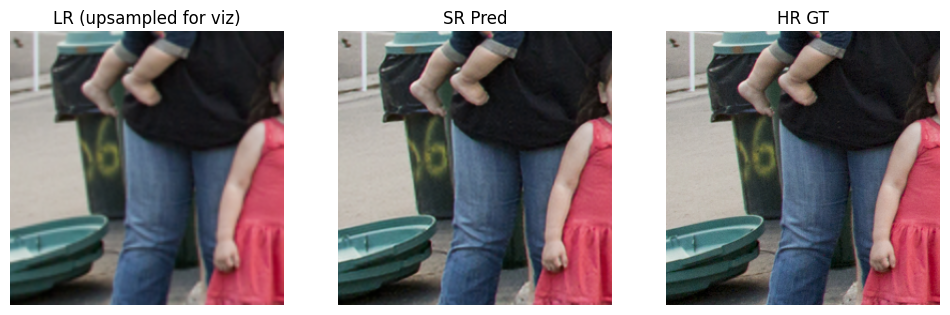

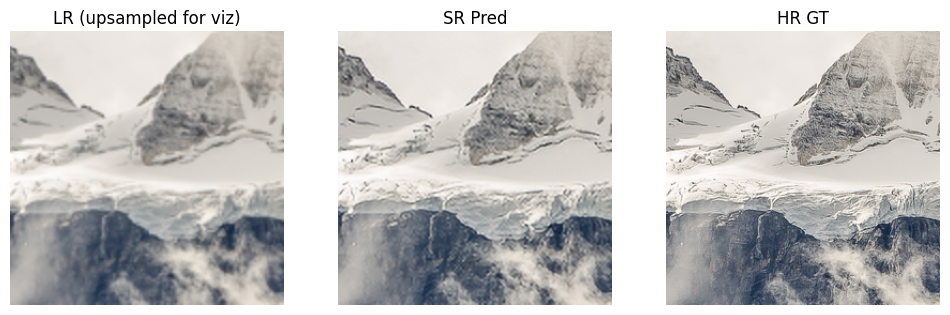

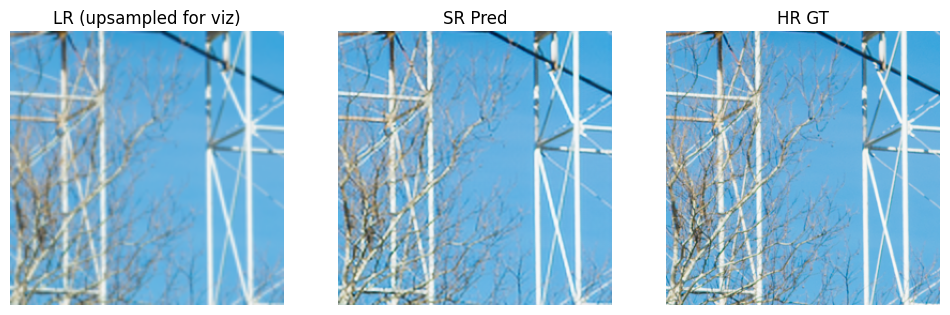

Saved checkpoint: checkpoints/sr2_epoch002.pt
New best model saved to checkpoints/sr2_best.pt
[Epoch 3/5] loss=0.0154, psnr=31.26 dB, time=1744.0s
New best model saved to checkpoints/sr2_best.pt
[Epoch 4/5] loss=0.0150, psnr=31.45 dB, time=1841.8s
Visualizing predictions...


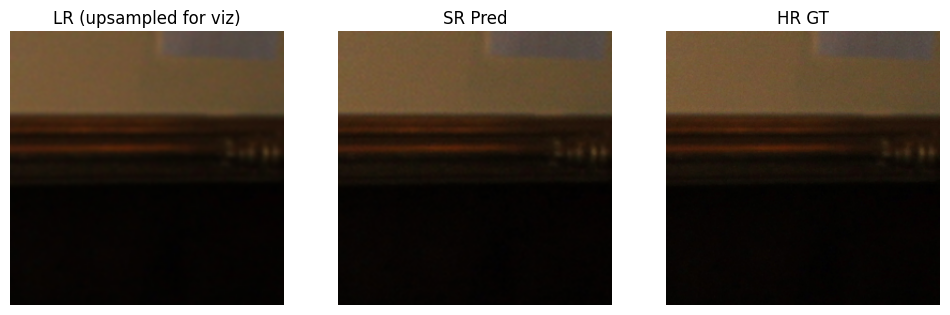

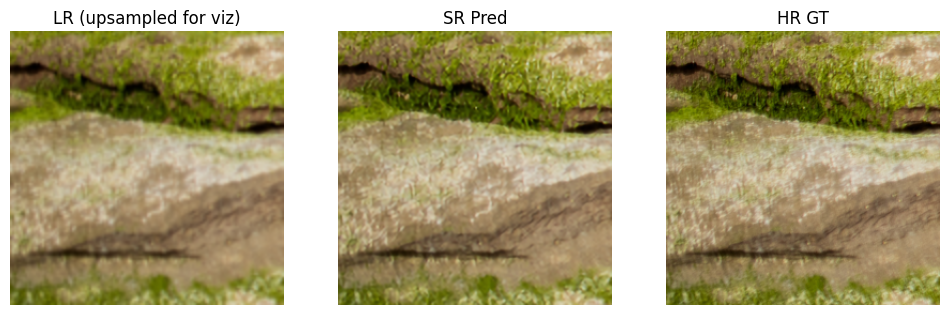

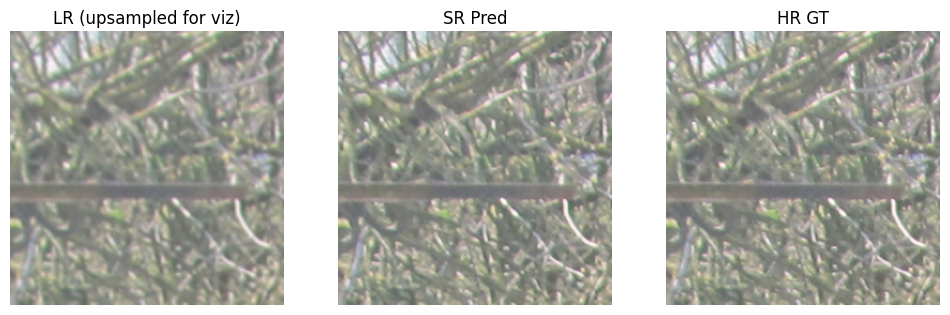

Saved checkpoint: checkpoints/sr2_epoch004.pt
New best model saved to checkpoints/sr2_best.pt
[Epoch 5/5] loss=0.0147, psnr=31.54 dB, time=1685.4s
Saved checkpoint: checkpoints/sr2_epoch005.pt
New best model saved to checkpoints/sr2_best.pt


In [67]:
for epoch in range(1, EPOCHS+1):
    t0 = time.time()
    train_loss, train_psnr = train_one_epoch(model, train_loader, loss_fn, optimizer, epoch, task_type)
    dt = time.time() - t0

    print(f"[Epoch {epoch}/{EPOCHS}] "
          f"loss={train_loss:.4f}, psnr={train_psnr:.2f} dB, "
          f"time={dt:.1f}s")

    # preview every few epochs
    if epoch % PREVIEW_INTERVAL == 0:
        print("Visualizing predictions...")
        visualize_predictions(model, train_loader, task_type)

    # save checkpoint
    if epoch % CKPT_INTERVAL == 0 or epoch == EPOCHS:
        ckpt_path = CKPT_DIR / f"{TASK}_epoch{epoch:03d}.pt"
        torch.save({ 
            "model_state": model.state_dict(),
            "optimizer_state": optimizer.state_dict(),
            "epoch": epoch,
            "loss": train_loss,
        }, ckpt_path)
        print(f"Saved checkpoint: {ckpt_path}")

    # track best (optional)
    if train_loss < best_loss:
        best_loss = train_loss
        best_path = CKPT_DIR / f"{TASK}_best.pt"
        torch.save(model.state_dict(), best_path)
        print(f"New best model saved to {best_path}")

In [68]:
TASK='denoise'
best_loss = float("inf")

In [69]:
dataset, train_loader, model, loss_fn, optimizer, task_type = make_task_components(TASK)
print(f"Dataset size for {TASK}: {len(dataset)} samples")
print(model)

DenoiseDataset: found 131277 entries in lmdb_final/dataset.lmdb
Dataset size for denoise: 131277 samples
DnCNN(
  (net): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): ReLU(inplace=True)
    (5): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): ReLU(inplace=True)
    (8): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): ReLU(inplace=True)
    (11): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (12): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (13): ReLU(inplace

[Epoch 1/5] loss=0.0309, psnr=27.38 dB, time=2410.4s
New best model saved to checkpoints/denoise_best.pt
[Epoch 2/5] loss=0.0259, psnr=28.69 dB, time=2640.8s
Visualizing predictions...


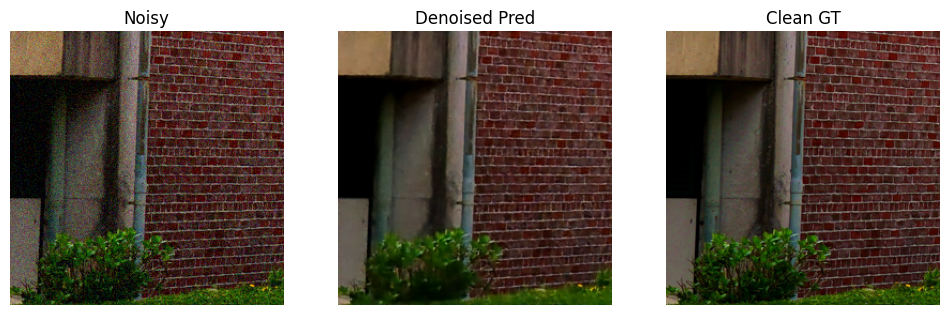

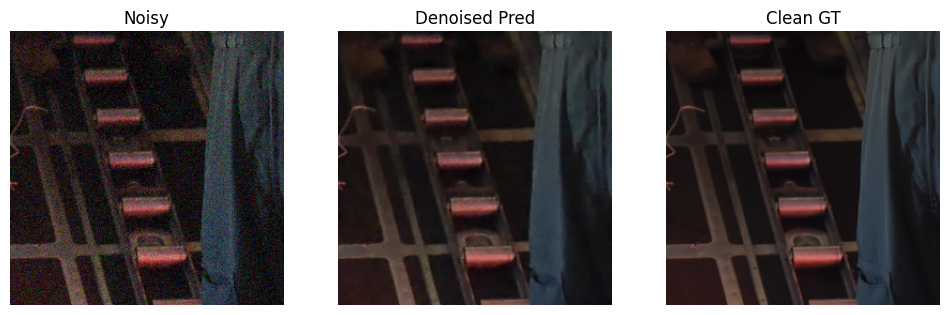

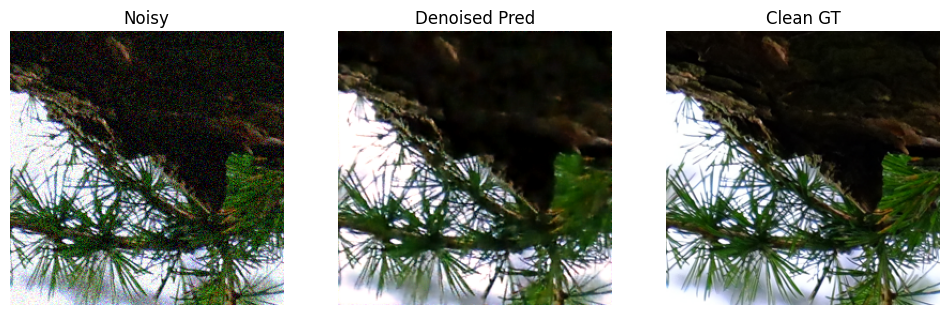

Saved checkpoint: checkpoints/denoise_epoch002.pt
New best model saved to checkpoints/denoise_best.pt
[Epoch 3/5] loss=0.0244, psnr=29.19 dB, time=2624.9s
New best model saved to checkpoints/denoise_best.pt
[Epoch 4/5] loss=0.0234, psnr=29.48 dB, time=2463.5s
Visualizing predictions...


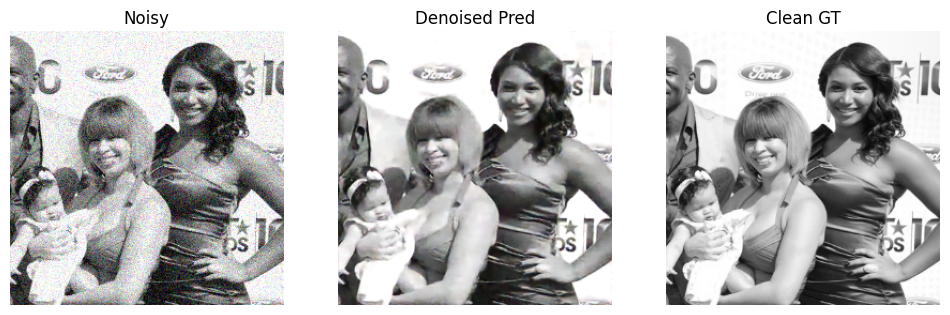

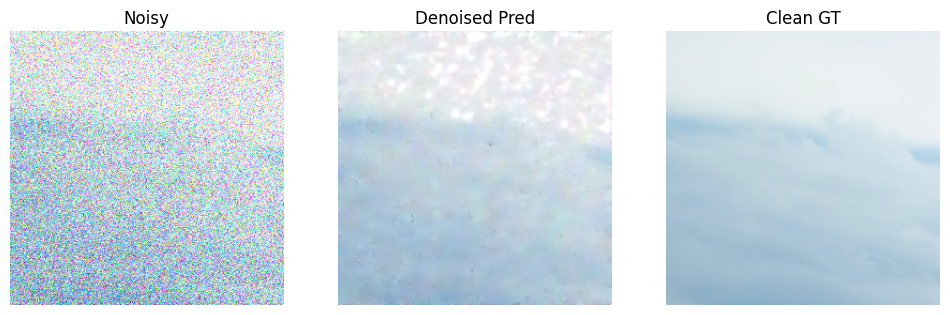

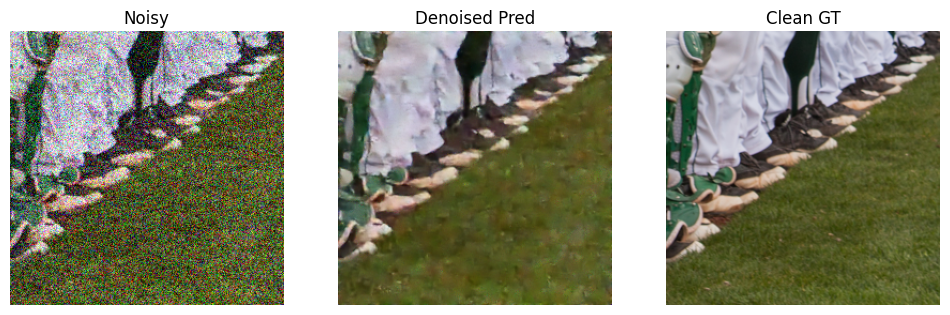

Saved checkpoint: checkpoints/denoise_epoch004.pt
New best model saved to checkpoints/denoise_best.pt
[Epoch 5/5] loss=0.0228, psnr=29.67 dB, time=2467.5s
Saved checkpoint: checkpoints/denoise_epoch005.pt
New best model saved to checkpoints/denoise_best.pt


In [70]:
for epoch in range(1, EPOCHS+1):
    t0 = time.time()
    train_loss, train_psnr = train_one_epoch(model, train_loader, loss_fn, optimizer, epoch, task_type)
    dt = time.time() - t0

    print(f"[Epoch {epoch}/{EPOCHS}] "
          f"loss={train_loss:.4f}, psnr={train_psnr:.2f} dB, "
          f"time={dt:.1f}s")

    # preview every few epochs
    if epoch % PREVIEW_INTERVAL == 0:
        print("Visualizing predictions...")
        visualize_predictions(model, train_loader, task_type)

    # save checkpoint
    if epoch % CKPT_INTERVAL == 0 or epoch == EPOCHS:
        ckpt_path = CKPT_DIR / f"{TASK}_epoch{epoch:03d}.pt"
        torch.save({ 
            "model_state": model.state_dict(),
            "optimizer_state": optimizer.state_dict(),
            "epoch": epoch,
            "loss": train_loss,
        }, ckpt_path)
        print(f"Saved checkpoint: {ckpt_path}")

    # track best (optional)
    if train_loss < best_loss:
        best_loss = train_loss
        best_path = CKPT_DIR / f"{TASK}_best.pt"
        torch.save(model.state_dict(), best_path)
        print(f"New best model saved to {best_path}")

In [82]:
import cv2

In [83]:
TASK='colorize'
best_loss = float("inf")

In [84]:
dataset, train_loader, model, loss_fn, optimizer, task_type = make_task_components(TASK)
print(f"Dataset size for {TASK}: {len(dataset)} samples")
print(model)

ColorizationDataset: found 131277 entries in lmdb_final/dataset.lmdb
Dataset size for colorize: 131277 samples
ColorizationUNet(
  (down1): DoubleConv(
    (block): Sequential(
      (0): Conv2d(1, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
      (3): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (4): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (5): ReLU(inplace=True)
    )
  )
  (pool1): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (down2): DoubleConv(
    (block): Sequential(
      (0): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
      (3): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (4)

[Epoch 1/5] loss=0.0808, psnr=0.00 dB, time=1393.2s
New best model saved to checkpoints/colorize_best.pt
[Epoch 2/5] loss=0.0788, psnr=0.00 dB, time=1396.5s
Visualizing predictions...


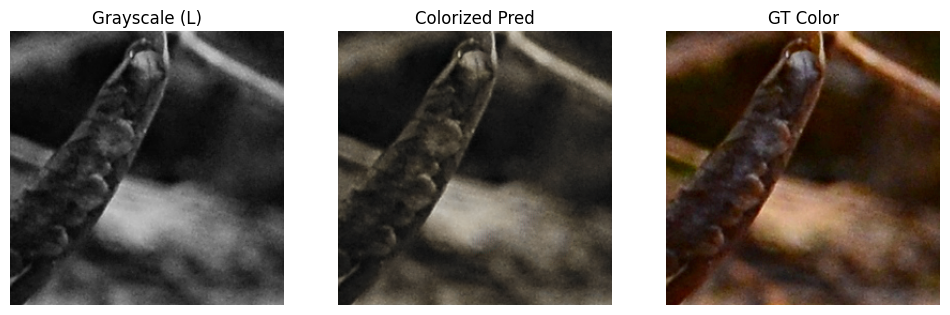

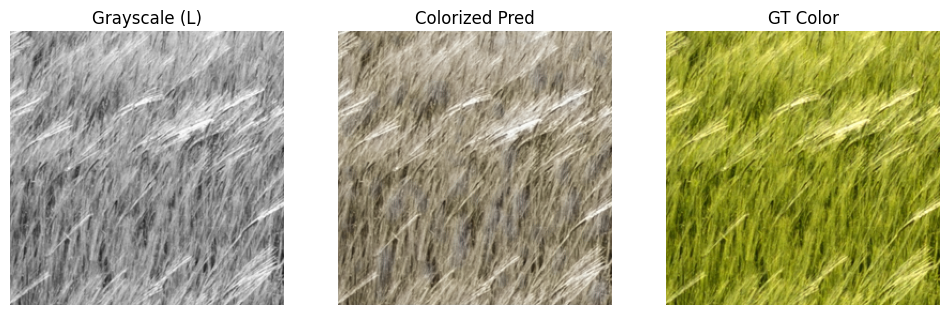

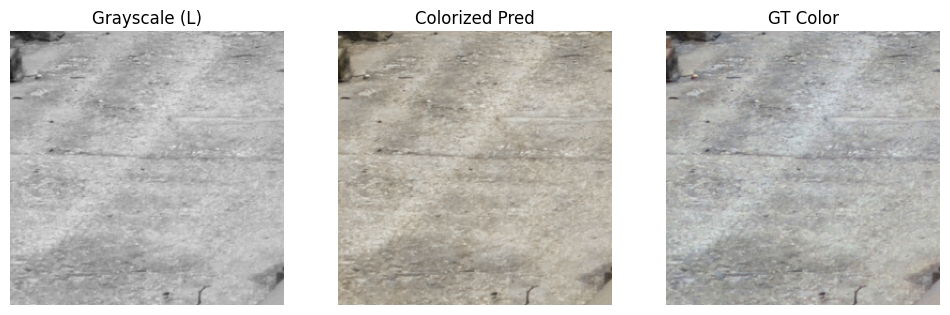

Saved checkpoint: checkpoints/colorize_epoch002.pt
New best model saved to checkpoints/colorize_best.pt
[Epoch 3/5] loss=0.0781, psnr=0.00 dB, time=1373.0s
New best model saved to checkpoints/colorize_best.pt
[Epoch 4/5] loss=0.0777, psnr=0.00 dB, time=1389.8s
Visualizing predictions...


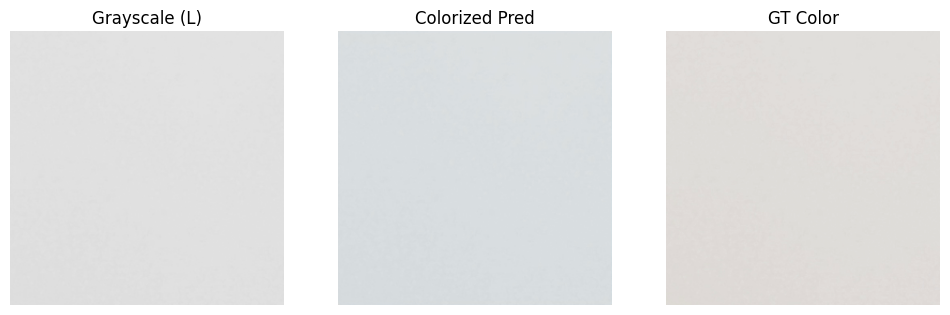

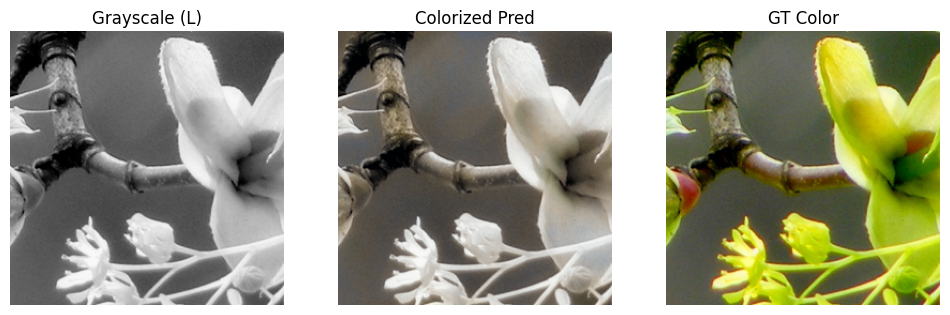

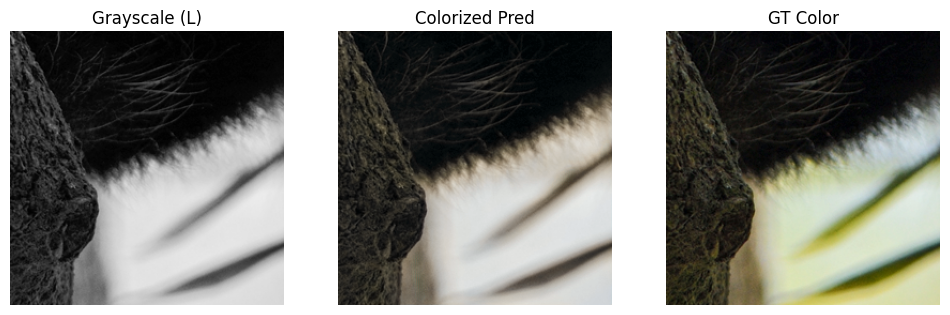

Saved checkpoint: checkpoints/colorize_epoch004.pt
New best model saved to checkpoints/colorize_best.pt
[Epoch 5/5] loss=0.0775, psnr=0.00 dB, time=1446.2s
Saved checkpoint: checkpoints/colorize_epoch005.pt
New best model saved to checkpoints/colorize_best.pt


In [85]:
for epoch in range(1, EPOCHS+1):
    t0 = time.time()
    train_loss, train_psnr = train_one_epoch(model, train_loader, loss_fn, optimizer, epoch, task_type)
    dt = time.time() - t0

    print(f"[Epoch {epoch}/{EPOCHS}] "
          f"loss={train_loss:.4f}, psnr={train_psnr:.2f} dB, "
          f"time={dt:.1f}s")

    # preview every few epochs
    if epoch % PREVIEW_INTERVAL == 0:
        print("Visualizing predictions...")
        visualize_predictions(model, train_loader, task_type)

    # save checkpoint
    if epoch % CKPT_INTERVAL == 0 or epoch == EPOCHS:
        ckpt_path = CKPT_DIR / f"{TASK}_epoch{epoch:03d}.pt"
        torch.save({ 
            "model_state": model.state_dict(),
            "optimizer_state": optimizer.state_dict(),
            "epoch": epoch,
            "loss": train_loss,
        }, ckpt_path)
        print(f"Saved checkpoint: {ckpt_path}")

    # track best (optional)
    if train_loss < best_loss:
        best_loss = train_loss
        best_path = CKPT_DIR / f"{TASK}_best.pt"
        torch.save(model.state_dict(), best_path)
        print(f"New best model saved to {best_path}")

In [86]:
TASK='inpaint'
best_loss = float("inf")

In [87]:
dataset, train_loader, model, loss_fn, optimizer, task_type = make_task_components(TASK)
print(f"Dataset size for {TASK}: {len(dataset)} samples")
print(model)

InpaintingDataset: found 131277 entries in lmdb_final/dataset.lmdb
Dataset size for inpaint: 131277 samples
InpaintUNet(
  (down1): DoubleConv(
    (block): Sequential(
      (0): Conv2d(4, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
      (3): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (4): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (5): ReLU(inplace=True)
    )
  )
  (pool1): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (down2): DoubleConv(
    (block): Sequential(
      (0): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
      (3): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (4): BatchN

[Epoch 1/5] loss=0.0503, psnr=20.88 dB, time=1452.1s
New best model saved to checkpoints/inpaint_best.pt
[Epoch 2/5] loss=0.0349, psnr=22.29 dB, time=1434.4s
Visualizing predictions...


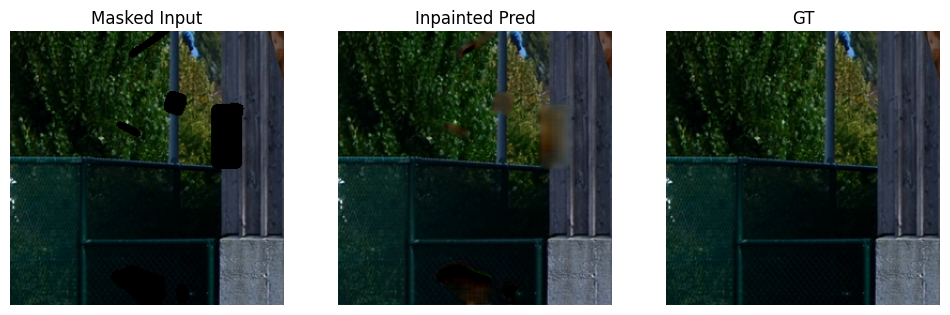

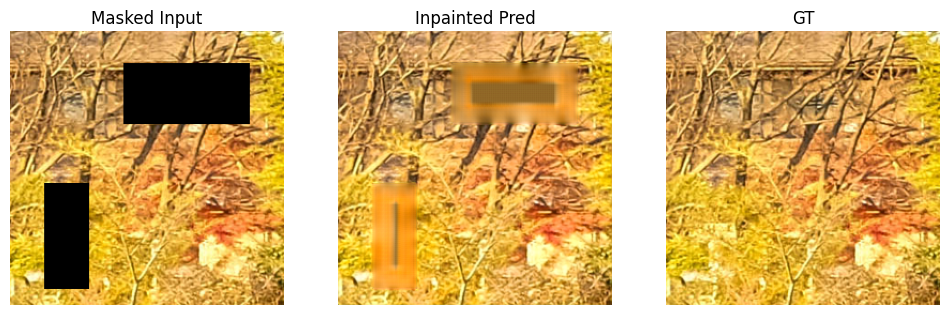

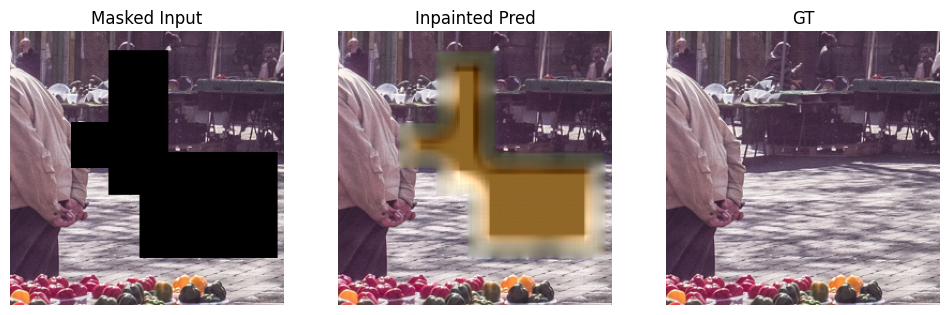

Saved checkpoint: checkpoints/inpaint_epoch002.pt
New best model saved to checkpoints/inpaint_best.pt
[Epoch 3/5] loss=0.0315, psnr=22.71 dB, time=1406.3s
New best model saved to checkpoints/inpaint_best.pt
[Epoch 4/5] loss=0.0295, psnr=22.95 dB, time=1413.1s
Visualizing predictions...


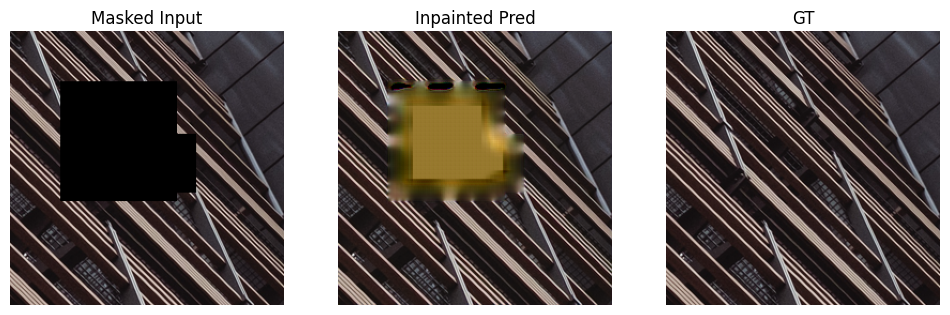

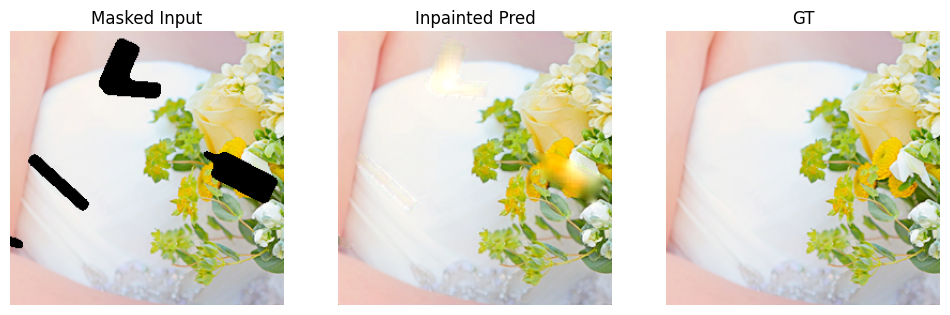

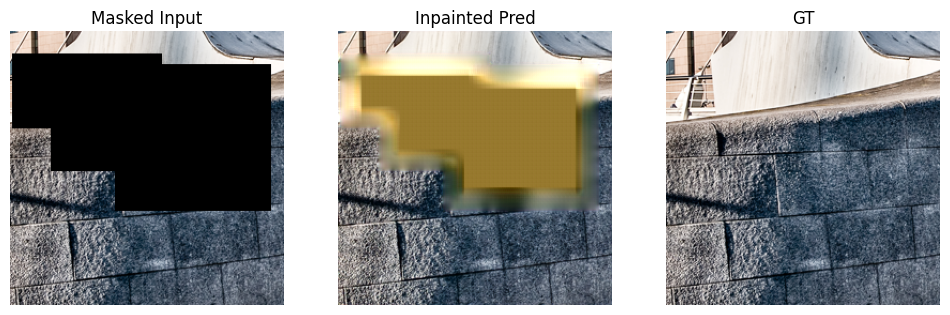

Saved checkpoint: checkpoints/inpaint_epoch004.pt
New best model saved to checkpoints/inpaint_best.pt
[Epoch 5/5] loss=0.0284, psnr=23.03 dB, time=1432.1s
Saved checkpoint: checkpoints/inpaint_epoch005.pt
New best model saved to checkpoints/inpaint_best.pt


In [88]:
for epoch in range(1, EPOCHS+1):
    t0 = time.time()
    train_loss, train_psnr = train_one_epoch(model, train_loader, loss_fn, optimizer, epoch, task_type)
    dt = time.time() - t0

    print(f"[Epoch {epoch}/{EPOCHS}] "
          f"loss={train_loss:.4f}, psnr={train_psnr:.2f} dB, "
          f"time={dt:.1f}s")

    # preview every few epochs
    if epoch % PREVIEW_INTERVAL == 0:
        print("Visualizing predictions...")
        visualize_predictions(model, train_loader, task_type)

    # save checkpoint
    if epoch % CKPT_INTERVAL == 0 or epoch == EPOCHS:
        ckpt_path = CKPT_DIR / f"{TASK}_epoch{epoch:03d}.pt"
        torch.save({ 
            "model_state": model.state_dict(),
            "optimizer_state": optimizer.state_dict(),
            "epoch": epoch,
            "loss": train_loss,
        }, ckpt_path)
        print(f"Saved checkpoint: {ckpt_path}")

    # track best (optional)
    if train_loss < best_loss:
        best_loss = train_loss
        best_path = CKPT_DIR / f"{TASK}_best.pt"
        torch.save(model.state_dict(), best_path)
        print(f"New best model saved to {best_path}")

# Pretrained Models

In [107]:
import torch
import csv
import datetime
from pathlib import Path

import imageio.v2 as imageio

In [90]:
CHECKPOINT_DIR = Path("checkpoints")
CHECKPOINT_DIR.mkdir(exist_ok=True)

In [108]:
EXPERIMENTS_DIR = Path("experiments")
EXPERIMENTS_DIR.mkdir(exist_ok=True)

In [91]:
print("Checkpoint directory:", CHECKPOINT_DIR)
DEVICE = "mps" if torch.backends.mps.is_available() else "cuda" if torch.cuda.is_available() else "cpu"
print("Using device:", DEVICE)

Checkpoint directory: checkpoints
Using device: mps


In [92]:
import urllib.request

In [97]:
pretrained_files = {
    "pretrained_realesrgan_x4.pth": "https://github.com/xinntao/Real-ESRGAN/releases/download/v0.2.5.0/realesr-general-x4v3.pth",
    "pretrained_drunet.pth": "https://huggingface.co/deepinv/drunet/resolve/main/drunet_color.pth",
    "pretrained_colorization_eccv16.pth": "https://colorizers.s3.us-east-2.amazonaws.com/colorization_release_v2-9b330a0b.pth",
    "pretrained_lama.pth": "https://github.com/Sanster/models/releases/download/add_big_lama/big-lama.pt",
}

In [100]:
for fname, url in pretrained_files.items():
    dest = CHECKPOINT_DIR / fname
    if dest.exists():
        print(f"✔ Already downloaded: {fname}")
    else:
        print(f"⬇ Downloading {fname}...")
        urllib.request.urlretrieve(url, dest)
        print(f"✔ Saved to {dest}")

⬇ Downloading pretrained_realesrgan_x4.pth...
✔ Saved to checkpoints/pretrained_realesrgan_x4.pth
⬇ Downloading pretrained_drunet.pth...
✔ Saved to checkpoints/pretrained_drunet.pth
⬇ Downloading pretrained_colorization_eccv16.pth...
✔ Saved to checkpoints/pretrained_colorization_eccv16.pth
⬇ Downloading pretrained_lama.pth...
✔ Saved to checkpoints/pretrained_lama.pth


In [109]:
import torch
import torch.nn.functional as F
import numpy as np
import cv2
import matplotlib.pyplot as plt

In [111]:
DEVICE = "mps" if torch.backends.mps.is_available() else (
    "cuda" if torch.cuda.is_available() else "cpu"
)
DEVICE_TYPE = "cuda" if DEVICE == "cuda" else ("mps" if DEVICE == "mps" else "cpu")

print("Fine-tune device:", DEVICE)

Fine-tune device: mps


In [112]:
def create_experiment_dir(task_name: str) -> Path:
    ts = datetime.datetime.now().strftime("%Y-%m-%d_%H-%M-%S")
    d = EXPERIMENTS_DIR / ts / task_name
    d.mkdir(parents=True, exist_ok=True)
    return d

In [113]:
def psnr(pred, target, max_val=1.0):
    mse = F.mse_loss(pred, target, reduction="mean")
    if mse == 0:
        return torch.tensor(99.0)
    return 20 * torch.log10(torch.tensor(max_val)) - 10 * torch.log10(mse)

In [114]:
def make_preview_frame(task_type: str, batch, model) -> np.ndarray:
    """
    Returns a single HxWx3 numpy frame in [0,1] showing:
    SR:     [LR-upsampled | Pred | HR]
    Denoise:[Noisy | Pred | Clean]
    Color:  [Gray L | Pred RGB | GT RGB]
    Inpaint:[Masked | Pred | GT]
    """
    model.eval()
    with torch.no_grad():
        if task_type in ("sr2", "sr4", "sr"):
            lr = batch["lr"].to(DEVICE).contiguous()
            hr = batch["hr"].to(DEVICE).contiguous()
            pred = model(lr)

            i = 0
            # upsample LR to HR size for visualization
            lr_up = F.interpolate(
                lr[i:i+1], size=hr[i].shape[1:], mode="bilinear", align_corners=False
            )[0]

            imgs = [lr_up, pred[i], hr[i]]

        elif task_type == "denoise":
            noisy = batch["noisy"].to(DEVICE).contiguous()
            clean = batch["clean"].to(DEVICE).contiguous()
            pred = model(noisy)

            i = 0
            imgs = [noisy[i], pred[i], clean[i]]

        elif task_type == "colorize":
            L = batch["L"].to(DEVICE).contiguous()
            ab = batch["ab"].to(DEVICE).contiguous()
            pred_ab = model(L)

            i = 0
            # L is (B,1,H,W) in [0,1]
            L_i = (L[i,0].cpu().numpy() * 255.0).astype(np.uint8)
            ab_gt = (ab[i].cpu().numpy() * 128.0 + 128.0).astype(np.uint8)
            ab_pr = (pred_ab[i].cpu().numpy() * 128.0 + 128.0).astype(np.uint8)

            def lab_to_rgb(L_, ab_):
                lab = np.stack([L_, ab_[0], ab_[1]], axis=-1).astype(np.uint8)
                bgr = cv2.cvtColor(lab, cv2.COLOR_LAB2BGR)
                rgb = bgr[..., ::-1].astype(np.float32) / 255.0
                return rgb

            gray = np.stack([L_i, L_i, L_i], axis=-1).astype(np.float32) / 255.0
            rgb_pr = lab_to_rgb(L_i, ab_pr)
            rgb_gt = lab_to_rgb(L_i, ab_gt)

            imgs = [gray, rgb_pr, rgb_gt]

            # convert to proper shape/array below
            frames = []
            for im in imgs:
                if isinstance(im, torch.Tensor):
                    im = im.detach().cpu().permute(1,2,0).numpy()
                frames.append(np.clip(im, 0, 1))
            return np.concatenate(frames, axis=1)

        elif task_type == "inpaint":
            masked = batch["masked"].to(DEVICE).contiguous()
            mask = batch["mask"].to(DEVICE).contiguous()
            gt = batch["gt"].to(DEVICE).contiguous()
            pred = model(masked, mask)

            i = 0
            imgs = [masked[i], pred[i], gt[i]]

        else:
            raise ValueError(f"Unknown task_type for preview: {task_type}")

        frames = []
        for im in imgs:
            if isinstance(im, torch.Tensor):
                im = im.detach().cpu().permute(1,2,0).numpy()
            frames.append(np.clip(im, 0, 1))
        frame = np.concatenate(frames, axis=1)
        return frame

In [102]:
def load_pretrained_model(task):
    if task == "sr":
        from realesrgan import RealESRGAN  # small python wrapper shipped via pip install realesrgan
        model = RealESRGAN(scale=4).to(DEVICE)
        state = torch.load(CHECKPOINT_DIR / "pretrained_realesrgan_x4.pth", map_location=DEVICE)
        model.load_state_dict(state, strict=False)
        return model

    elif task == "denoise":
        from basicsr.archs.drunet_arch import DRUNet
        model = DRUNet(in_nc=3, out_nc=3, nc=64, nb=6).to(DEVICE)
        state = torch.load(CHECKPOINT_DIR / "pretrained_drunet.pth", map_location=DEVICE)
        model.load_state_dict(state, strict=False)
        return model

    elif task == "colorize":
        from colorizers.eccv16 import ECCVGenerator
        model = ECCVGenerator().to(DEVICE)
        state = torch.load(CHECKPOINT_DIR / "pretrained_colorization_eccv16.pth", map_location=DEVICE)
        model.load_state_dict(state, strict=False)
        return model

    elif task == "inpaint":
        from lama_inpaint import LaMaGenerator
        model = LaMaGenerator().to(DEVICE)
        state = torch.load(CHECKPOINT_DIR / "pretrained_lama.pth", map_location=DEVICE)
        model.load_state_dict(state, strict=False)
        return model

    else:
        raise ValueError("Unknown task")

In [115]:
from torch.utils.data import DataLoader
from tqdm.auto import tqdm

In [116]:
FT_LR = 1e-5
FT_EPOCHS = 3
BATCH_SIZE_FT = 4
GIF_FPS = 15

In [123]:
def run_finetune(task_type: str, model: torch.nn.Module, dataset: torch.utils.data.Dataset):
    """
    task_type: "sr2", "sr4", "denoise", "colorize", "inpaint"
    model:     model already moved to DEVICE, with pretrained weights loaded
    dataset:   matching dataset (e.g., SuperResolutionDatasetX4)
    """
    exp_dir = create_experiment_dir(task_type)
    print("Experiment directory:", exp_dir)

    loader = DataLoader(dataset, batch_size=BATCH_SIZE_FT, shuffle=True, num_workers=0)
    loss_fn = torch.nn.L1Loss()
    optimizer = torch.optim.Adam(model.parameters(), lr=FT_LR)

    # logging
    log_path = exp_dir / "loss_psnr.csv"
    with open(log_path, "w", newline="") as f:
        writer = csv.writer(f)
        writer.writerow(["epoch", "loss", "psnr", "seconds"])

    best_loss = float("inf")
    best_ckpt_path = exp_dir / "best.pth"
    frames = []

    for epoch in range(1, FT_EPOCHS + 1):
        model.train()
        epoch_loss = 0.0
        epoch_psnr = 0.0
        n_batches = 0
        t0 = time.time()

        pbar = tqdm(loader, desc=f"[{task_type}] Epoch {epoch}/{FT_EPOCHS}")
        for batch in pbar:
            optimizer.zero_grad(set_to_none=True)

            # forward by task
            if task_type in ("sr2", "sr4", "sr"):
                lr = batch["lr"].to(DEVICE).contiguous()
                hr = batch["hr"].to(DEVICE).contiguous()
                pred = model(lr)
                target = hr
            elif task_type == "denoise":
                noisy = batch["noisy"].to(DEVICE).contiguous()
                clean = batch["clean"].to(DEVICE).contiguous()
                pred = model(noisy)
                target = clean
            elif task_type == "colorize":
                L = batch["L"].to(DEVICE).contiguous()
                ab = batch["ab"].to(DEVICE).contiguous()
                pred = model(L)
                target = ab
            elif task_type == "inpaint":
                masked = batch["masked"].to(DEVICE).contiguous()
                mask = batch["mask"].to(DEVICE).contiguous()
                gt = batch["gt"].to(DEVICE).contiguous()
                pred = model(masked, mask)
                target = gt
            else:
                raise ValueError(f"Unknown task_type: {task_type}")

            loss = loss_fn(pred, target)
            loss.backward()
            optimizer.step()

            # metrics
            with torch.no_grad():
                if task_type in ("sr2", "sr4", "sr", "denoise", "inpaint"):
                    p = torch.clamp(pred.detach(), 0, 1)
                    t = torch.clamp(target.detach(), 0, 1)
                    batch_psnr = psnr(p, t)
                else:
                    batch_psnr = torch.tensor(0.0)

            epoch_loss += loss.item()
            epoch_psnr += batch_psnr.item()
            n_batches += 1

            pbar.set_postfix({"loss": f"{loss.item():.4f}", "psnr": f"{batch_psnr.item():.2f}"})

        dt = time.time() - t0
        avg_loss = epoch_loss / max(n_batches, 1)
        avg_psnr = epoch_psnr / max(n_batches, 1)

        print(f"[{task_type}] Epoch {epoch}: loss={avg_loss:.4f}, psnr={avg_psnr:.2f} dB, time={dt:.1f}s")

        # append to CSV
        with open(log_path, "a", newline="") as f:
            writer = csv.writer(f)
            writer.writerow([epoch, avg_loss, avg_psnr, dt])

        # preview frame (one batch)
        batch_for_preview = next(iter(loader))
        frame = make_preview_frame(task_type, batch_for_preview, model)
        frames.append((np.clip(frame, 0, 1) * 255).astype(np.uint8))

        # track best
        if avg_loss < best_loss:
            best_loss = avg_loss
            torch.save(model.state_dict(), best_ckpt_path)
            print(f"  ↳ New best model saved to: {best_ckpt_path}")

    # write GIF
    gif_path = exp_dir / "evolution.gif"
    imageio.mimsave(gif_path, frames, fps=GIF_FPS)
    print(f"Evolution GIF saved to: {gif_path}")

In [129]:
sr2_model = SRNet(scale=2).to(DEVICE)

baseline_ckpt = Path("checkpoints") / "sr2_best.pt"
sr2_model.load_state_dict(torch.load(baseline_ckpt, map_location=DEVICE))
print("Loaded baseline weights from", baseline_ckpt)

Loaded baseline weights from checkpoints/sr2_best.pt


In [130]:
sr2_dataset = SuperResolutionDatasetX2(LMDB_PATH)

SuperResolutionDatasetX2: found 131277 entries in lmdb_final/dataset.lmdb


## Super Resolution x2

In [131]:
run_finetune("sr2", sr2_model, sr2_dataset)

Experiment directory: experiments/2025-11-23_22-00-48/sr2


[sr2] Epoch 1/3:   0%|          | 0/32820 [00:00<?, ?it/s]

[sr2] Epoch 1: loss=0.0142, psnr=32.42 dB, time=1908.7s
  ↳ New best model saved to: experiments/2025-11-23_22-00-48/sr2/best.pth


[sr2] Epoch 2/3:   0%|          | 0/32820 [00:00<?, ?it/s]

[sr2] Epoch 2: loss=0.0142, psnr=32.43 dB, time=1489.3s
  ↳ New best model saved to: experiments/2025-11-23_22-00-48/sr2/best.pth


[sr2] Epoch 3/3:   0%|          | 0/32820 [00:00<?, ?it/s]

[sr2] Epoch 3: loss=0.0142, psnr=32.47 dB, time=1511.0s
  ↳ New best model saved to: experiments/2025-11-23_22-00-48/sr2/best.pth
Evolution GIF saved to: experiments/2025-11-23_22-00-48/sr2/evolution.gif


## Denoise

In [132]:
dn_model = DnCNN().to(DEVICE)
dn_ckpt = Path("checkpoints") / "denoise_best.pt"   # adjust
dn_model.load_state_dict(torch.load(dn_ckpt, map_location=DEVICE))
dn_dataset = DenoiseDataset(LMDB_PATH)
run_finetune("denoise", dn_model, dn_dataset)

DenoiseDataset: found 131277 entries in lmdb_final/dataset.lmdb
Experiment directory: experiments/2025-11-23_23-26-16/denoise


[denoise] Epoch 1/3:   0%|          | 0/32820 [00:00<?, ?it/s]

[denoise] Epoch 1: loss=0.0224, psnr=30.05 dB, time=2520.5s
  ↳ New best model saved to: experiments/2025-11-23_23-26-16/denoise/best.pth


[denoise] Epoch 2/3:   0%|          | 0/32820 [00:00<?, ?it/s]

[denoise] Epoch 2: loss=0.0222, psnr=30.13 dB, time=2533.9s
  ↳ New best model saved to: experiments/2025-11-23_23-26-16/denoise/best.pth


[denoise] Epoch 3/3:   0%|          | 0/32820 [00:00<?, ?it/s]

[denoise] Epoch 3: loss=0.0221, psnr=30.18 dB, time=2604.0s
  ↳ New best model saved to: experiments/2025-11-23_23-26-16/denoise/best.pth
Evolution GIF saved to: experiments/2025-11-23_23-26-16/denoise/evolution.gif


## Colorization

In [133]:
col_model = ColorizationUNet().to(DEVICE)
col_ckpt = Path("checkpoints") / "colorize_best.pt"
col_model.load_state_dict(torch.load(col_ckpt, map_location=DEVICE))
col_dataset = ColorizationDataset(LMDB_PATH)
run_finetune("colorize", col_model, col_dataset)

ColorizationDataset: found 131277 entries in lmdb_final/dataset.lmdb
Experiment directory: experiments/2025-11-24_01-37-27/colorize


[colorize] Epoch 1/3:   0%|          | 0/32820 [00:00<?, ?it/s]

[colorize] Epoch 1: loss=0.0770, psnr=0.00 dB, time=1405.5s
  ↳ New best model saved to: experiments/2025-11-24_01-37-27/colorize/best.pth


[colorize] Epoch 2/3:   0%|          | 0/32820 [00:00<?, ?it/s]

[colorize] Epoch 2: loss=0.0768, psnr=0.00 dB, time=1393.7s
  ↳ New best model saved to: experiments/2025-11-24_01-37-27/colorize/best.pth


[colorize] Epoch 3/3:   0%|          | 0/32820 [00:00<?, ?it/s]

[colorize] Epoch 3: loss=0.0767, psnr=0.00 dB, time=1393.7s
  ↳ New best model saved to: experiments/2025-11-24_01-37-27/colorize/best.pth
Evolution GIF saved to: experiments/2025-11-24_01-37-27/colorize/evolution.gif


## Inpainting

In [134]:
inp_model = InpaintUNet().to(DEVICE)
inp_ckpt = Path("checkpoints") / "inpaint_best.pt"
inp_model.load_state_dict(torch.load(inp_ckpt, map_location=DEVICE))
inp_dataset = InpaintingDataset(LMDB_PATH)
run_finetune("inpaint", inp_model, inp_dataset)

InpaintingDataset: found 131277 entries in lmdb_final/dataset.lmdb
Experiment directory: experiments/2025-11-24_02-51-06/inpaint


[inpaint] Epoch 1/3:   0%|          | 0/32820 [00:00<?, ?it/s]

[inpaint] Epoch 1: loss=0.0273, psnr=23.90 dB, time=1433.7s
  ↳ New best model saved to: experiments/2025-11-24_02-51-06/inpaint/best.pth


[inpaint] Epoch 2/3:   0%|          | 0/32820 [00:00<?, ?it/s]

[inpaint] Epoch 2: loss=0.0264, psnr=24.01 dB, time=1420.4s
  ↳ New best model saved to: experiments/2025-11-24_02-51-06/inpaint/best.pth


[inpaint] Epoch 3/3:   0%|          | 0/32820 [00:00<?, ?it/s]

[inpaint] Epoch 3: loss=0.0258, psnr=24.14 dB, time=1437.4s
  ↳ New best model saved to: experiments/2025-11-24_02-51-06/inpaint/best.pth
Evolution GIF saved to: experiments/2025-11-24_02-51-06/inpaint/evolution.gif


# Evals

In [135]:
import torch
from pathlib import Path
import random
import numpy as np
from torch.utils.data import DataLoader

In [136]:
RESULTS_DIR = Path("results")
RESULTS_DIR.mkdir(exist_ok=True)

In [137]:
DEVICE = "mps" if torch.backends.mps.is_available() else (
    "cuda" if torch.cuda.is_available() else "cpu"
)

In [138]:
print("Evaluation device:", DEVICE)
N_SAMPLES = 300

Evaluation device: mps


In [139]:
import torch.nn.functional as F
import matplotlib.pyplot as plt
import cv2

In [140]:
def compute_psnr(pred, target):
    mse = F.mse_loss(pred, target, reduction="mean")
    if mse == 0:
        return 99.0
    return 20 * torch.log10(torch.tensor(1.0)) - 10 * torch.log10(mse)


In [141]:
def compute_ssim(img1, img2):
    # quick three-channel SSIM without skimage dependency
    C1, C2 = 0.01**2, 0.03**2
    mu1 = F.avg_pool2d(img1, 3, 1, 0)
    mu2 = F.avg_pool2d(img2, 3, 1, 0)
    mu1_sq = mu1**2
    mu2_sq = mu2**2
    mu1_mu2 = mu1 * mu2
    sigma1_sq = F.avg_pool2d(img1 * img1, 3, 1, 0) - mu1_sq
    sigma2_sq = F.avg_pool2d(img2 * img2, 3, 1, 0) - mu2_sq
    sigma12 = F.avg_pool2d(img1 * img2, 3, 1, 0) - mu1_mu2
    ssim_num = (2 * mu1_mu2 + C1) * (2 * sigma12 + C2)
    ssim_den = (mu1_sq + mu2_sq + C1) * (sigma1_sq + sigma2_sq + C2)
    return torch.clamp((ssim_num / ssim_den).mean(), 0, 1).item()

In [142]:
def save_comparison_grid(input_img, base_img, ft_img, gt_img, save_path):
    inp = input_img
    b = base_img
    f = ft_img
    g = gt_img
    row = np.concatenate([inp, b, f, g], axis=1)
    plt.imsave(save_path, np.clip(row, 0, 1))

In [143]:
import csv
from tqdm.auto import tqdm

In [149]:
def make_model(task):
    """Return an uninitialized model corresponding to the given task.
       MUST match the same model architecture used during baseline + fine-tuning.
    """
    if task in ("sr2", "sr"):
        return SRNet(scale=2)                     # same baseline architecture
    elif task == "sr4":
        return SRNet(scale=4)
    elif task == "denoise":
        return DnCNN()                             # or whatever class you used
    elif task == "colorize":
        return ColorizationUNet()                  # whatever class name you used
    elif task == "inpaint":
        return InpaintUNet()                       # same as fine-tuning
    else:
        raise ValueError(f"Unknown task: {task}")

In [150]:
def evaluate_task(task, baseline_ckpt, finetune_ckpt, dataset):
    print(f"\n=== Evaluating {task.upper()} ===")

    task_dir = RESULTS_DIR / task
    task_dir.mkdir(exist_ok=True)

    loader = DataLoader(dataset, batch_size=1, shuffle=True, num_workers=0)
    samples = random.sample(list(range(len(dataset))), N_SAMPLES)

    # Prepare CSV
    csv_path = task_dir / "metrics.csv"
    with open(csv_path, "w", newline="") as f:
        writer = csv.writer(f)
        writer.writerow(["id", "baseline_psnr", "ft_psnr", "baseline_ssim", "ft_ssim"])

    # load models
    base_model = make_model(task).to(DEVICE)  # uses your same SRNet/DnCNN/UNet class
    ft_model = make_model(task).to(DEVICE)

    base_model.load_state_dict(torch.load(baseline_ckpt, map_location=DEVICE))
    ft_model.load_state_dict(torch.load(finetune_ckpt, map_location=DEVICE))
    base_model.eval()
    ft_model.eval()

    for idx in tqdm(samples):
        sample = dataset[idx]
        # run inference exactly as during training
        if task in ("sr2", "sr4", "sr"):
            lr = sample["lr"].unsqueeze(0).to(DEVICE)
            hr = sample["hr"].to(DEVICE)
            base = torch.clamp(base_model(lr)[0], 0, 1)
            ft = torch.clamp(ft_model(lr)[0], 0, 1)
            inp = F.interpolate(lr, size=hr.shape[1:], mode="bilinear", align_corners=False)[0]
            gt = hr

        elif task == "denoise":
            noisy = sample["noisy"].unsqueeze(0).to(DEVICE)
            clean = sample["clean"].to(DEVICE)
            base = torch.clamp(base_model(noisy)[0], 0, 1)
            ft = torch.clamp(ft_model(noisy)[0], 0, 1)
            inp = noisy[0]
            gt = clean

        elif task == "colorize":
            L = sample["L"].unsqueeze(0).to(DEVICE)
            ab = sample["ab"].to(DEVICE)
            base_ab = base_model(L)[0]
            ft_ab = ft_model(L)[0]
            # L+ab → RGB
            def lab_to_rgb(L_, ab_):
                L_ = (L_ * 255).astype("uint8")
                ab_ = (ab_ * 128 + 128).astype("uint8")
                lab = np.stack([L_, ab_[0], ab_[1]], axis=-1)
                bgr = cv2.cvtColor(lab, cv2.COLOR_LAB2BGR)
                return bgr[..., ::-1] / 255.0
            L_np = (L[0,0].cpu().numpy() * 255).astype(np.uint8)
            base = lab_to_rgb(L_np, base_ab.detach().cpu().numpy())
            ft = lab_to_rgb(L_np, ft_ab.detach().cpu().numpy())
            gt = lab_to_rgb(L_np, (ab.detach().cpu().numpy() * 128 + 128).astype(np.uint8))
            inp = np.stack([L_np, L_np, L_np], axis=-1) / 255.0
            base = torch.tensor(base).permute(2,0,1)
            ft = torch.tensor(ft).permute(2,0,1)
            gt = torch.tensor(gt).permute(2,0,1)
            inp = torch.tensor(inp).permute(2,0,1)

        elif task == "inpaint":
            masked = sample["masked"].unsqueeze(0).to(DEVICE)
            mask = sample["mask"].unsqueeze(0).to(DEVICE)
            gt = sample["gt"].to(DEVICE)
            base = torch.clamp(base_model(masked, mask)[0], 0, 1)
            ft = torch.clamp(ft_model(masked, mask)[0], 0, 1)
            inp = masked[0]

        # quantitative
        b_psnr = compute_psnr(base, gt)
        f_psnr = compute_psnr(ft, gt)
        b_ssim = compute_ssim(base.unsqueeze(0), gt.unsqueeze(0))
        f_ssim = compute_ssim(ft.unsqueeze(0), gt.unsqueeze(0))

        with open(csv_path, "a", newline="") as f:
            writer = csv.writer(f)
            writer.writerow([idx, b_psnr, f_psnr, b_ssim, f_ssim])

        # qualitative
        grid_path = task_dir / f"sample_{idx:05d}.png"
        save_comparison_grid(
            inp.cpu().numpy().transpose(1, 2, 0),
            base.detach().cpu().numpy().transpose(1, 2, 0),
            ft.detach().cpu().numpy().transpose(1, 2, 0),
            gt.detach().cpu().numpy().transpose(1, 2, 0),
            grid_path
        )

    print(f"Saved → {csv_path} and comparison grids to → {task_dir}")

In [151]:
evaluate_task("sr2",
    baseline_ckpt="checkpoints/sr2_best.pt",
    finetune_ckpt="experiments/2025-11-23_22-00-48/sr2/best.pth",
    dataset=SuperResolutionDatasetX2(LMDB_PATH),
)

SuperResolutionDatasetX2: found 131277 entries in lmdb_final/dataset.lmdb

=== Evaluating SR2 ===


  0%|          | 0/300 [00:00<?, ?it/s]

Saved → results/sr2/metrics.csv and comparison grids to → results/sr2


In [152]:
evaluate_task("denoise",
    baseline_ckpt="checkpoints/denoise_best.pt",
    finetune_ckpt="experiments/2025-11-23_23-26-16/denoise/best.pth",
    dataset=DenoiseDataset(LMDB_PATH),
)

DenoiseDataset: found 131277 entries in lmdb_final/dataset.lmdb

=== Evaluating DENOISE ===


  0%|          | 0/300 [00:00<?, ?it/s]

Saved → results/denoise/metrics.csv and comparison grids to → results/denoise


In [153]:
evaluate_task("colorize",
    baseline_ckpt="checkpoints/colorize_best.pt",
    finetune_ckpt="experiments/2025-11-24_01-37-27/colorize/best.pth",
    dataset=ColorizationDataset(LMDB_PATH),
)

ColorizationDataset: found 131277 entries in lmdb_final/dataset.lmdb

=== Evaluating COLORIZE ===


  0%|          | 0/300 [00:00<?, ?it/s]

Saved → results/colorize/metrics.csv and comparison grids to → results/colorize


In [154]:
evaluate_task("inpaint",
    baseline_ckpt="checkpoints/inpaint_best.pt",
    finetune_ckpt="experiments/2025-11-24_02-51-06/inpaint/best.pth",
    dataset=InpaintingDataset(LMDB_PATH),
)

InpaintingDataset: found 131277 entries in lmdb_final/dataset.lmdb

=== Evaluating INPAINT ===


  0%|          | 0/300 [00:00<?, ?it/s]

Saved → results/inpaint/metrics.csv and comparison grids to → results/inpaint


In [156]:
import pandas as pd
import matplotlib.pyplot as plt

In [160]:
def to_numeric(x):
    try:
        return float(x)
    except:
        if isinstance(x, str) and x.startswith("tensor("):
            return float(x.split("(")[1].split(",")[0])
        raise

In [158]:
task_names = ["sr2", "denoise", "colorize", "inpaint"]
avg_psnr_base = []
avg_psnr_ft = []
avg_ssim_base = []
avg_ssim_ft = []

In [161]:
for task in task_names:
    csv_path = Path("results") / task / "metrics.csv"
    if not csv_path.exists():
        print(f"Skipping missing → {task}")
        continue

    df = pd.read_csv(csv_path)

    df["baseline_psnr"] = df["baseline_psnr"].apply(to_numeric)
    df["ft_psnr"]       = df["ft_psnr"].apply(to_numeric)
    df["baseline_ssim"] = df["baseline_ssim"].apply(to_numeric)
    df["ft_ssim"]       = df["ft_ssim"].apply(to_numeric)

    avg_psnr_base.append(df["baseline_psnr"].mean())
    avg_psnr_ft.append(df["ft_psnr"].mean())
    avg_ssim_base.append(df["baseline_ssim"].mean())
    avg_ssim_ft.append(df["ft_ssim"].mean())

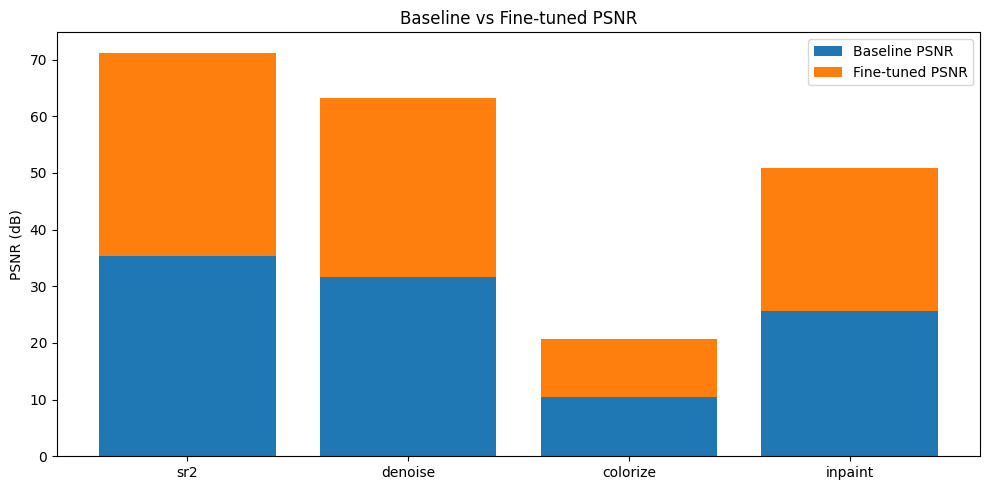

In [162]:
plt.figure(figsize=(10,5))
x = range(len(avg_psnr_base))
plt.bar(x, avg_psnr_base, label="Baseline PSNR")
plt.bar(x, avg_psnr_ft, bottom=avg_psnr_base, label="Fine-tuned PSNR")
plt.xticks(x, task_names)
plt.ylabel("PSNR (dB)")
plt.title("Baseline vs Fine-tuned PSNR")
plt.legend()
plt.tight_layout()
plt.savefig("results/metrics_psnr_plot.png")
plt.show()

In [163]:
import random
import matplotlib.pyplot as plt

In [164]:
TASKS = ["sr2", "denoise", "colorize", "inpaint"]
n_per_task = 1

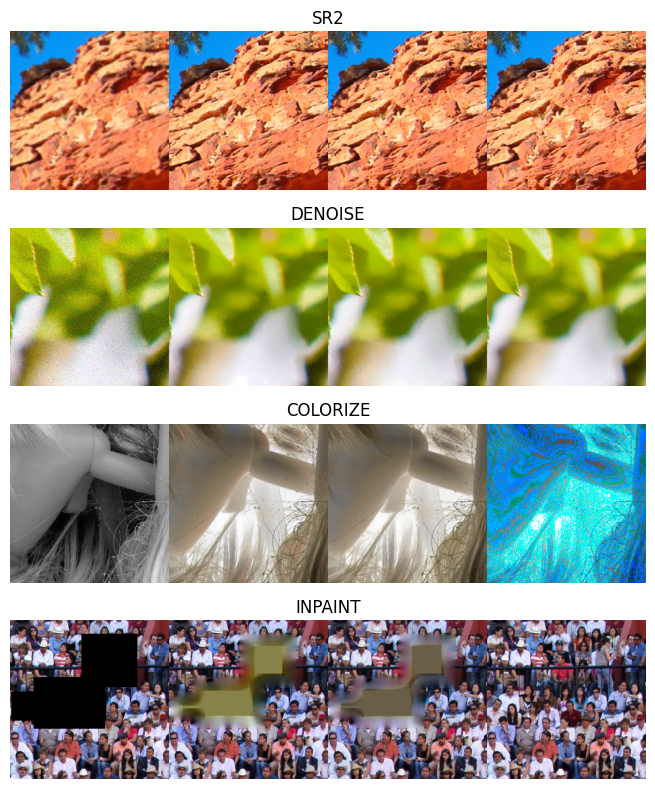

In [166]:
plt.figure(figsize=(16, 8))
row = 0

for task in TASKS:
    task_dir = Path("results") / task
    samples = list(task_dir.glob("sample_*.png"))
    chosen = random.choice(samples)

    img = plt.imread(chosen)
    plt.subplot(4, 1, row+1)
    plt.imshow(img)
    plt.title(task.upper())
    plt.axis("off")
    row += 1

plt.tight_layout()
plt.savefig("results/showcase_all_tasks.png")
plt.show()

In [171]:
from IPython.display import Image, display

In [172]:
def best_example(task):
    df = load_metrics(task)
    best = df.sort_values("improvement", ascending=False).iloc[0]["id"]
    return Path("results") / task / f"sample_{int(best):05d}.png"

In [173]:
for task in ["sr2", "denoise", "colorize", "inpaint"]:
    sample = best_example(task)
    print(f"{task.upper()} — best example → {sample}")
    display(Image(filename=str(sample)))

NameError: name 'load_metrics' is not defined

Evolution — sr2


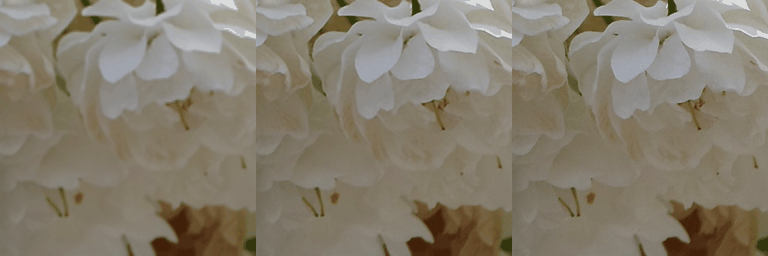

Evolution — denoise


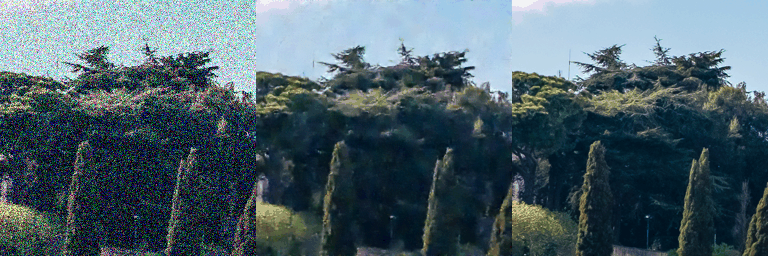

Evolution — colorize


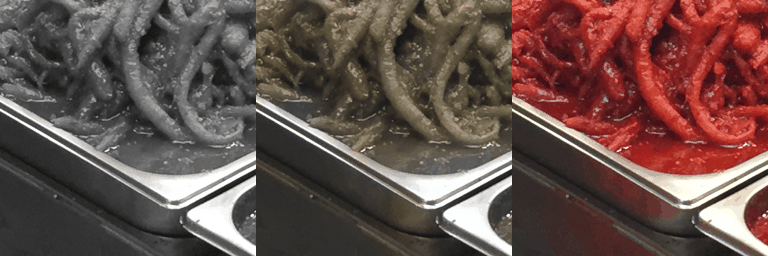

Evolution — inpaint


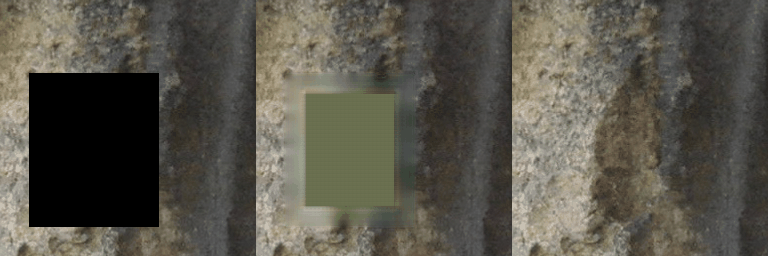

In [170]:
from IPython.display import Image, display
for task in ["sr2", "denoise", "colorize", "inpaint"]:
    gif = list((Path("experiments") / "").glob(f"**/{task}/evolution.gif"))
    if gif:
        print(f"Evolution — {task}")
        display(Image(filename=str(gif[-1])))

In [175]:
import imageio
import natsort

In [188]:
def make_evolution_gif(task, hold=8, fps=2):
    """
    hold = number of repeated frames per epoch image
    fps  = frames per second playback
    """
    task_dir = Path("results") / task
    pngs = sorted(task_dir.glob("sample_*.png"), key=natsort.natsort_key)

    if len(pngs) < 2:
        print(f"Skipping {task}: not enough frames for GIF ({len(pngs)} found)")
        return

    frames = []
    for p in pngs:
        img = imageio.imread(p)
        frames.extend([img] * hold)  # 👈 hold frame longer

    gif_path = task_dir / f"{task}_evolution.gif"
    imageio.mimsave(gif_path, frames, fps=fps)  # 👈 explicit metadata
    print(f"Saved → {gif_path} (frames: {len(frames)}, fps={fps}, hold={hold})")

In [189]:
for task in ["sr2", "denoise", "colorize", "inpaint"]:
    make_evolution_gif(task)

/var/folders/d9/34q0n1js31x765w00t009x6c0000gn/T/ipykernel_72650/2951365241.py:15: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  img = imageio.imread(p)


Saved → results/sr2/sr2_evolution.gif (frames: 2400, fps=2, hold=8)
Saved → results/denoise/denoise_evolution.gif (frames: 2400, fps=2, hold=8)
Saved → results/colorize/colorize_evolution.gif (frames: 2400, fps=2, hold=8)
Saved → results/inpaint/inpaint_evolution.gif (frames: 2400, fps=2, hold=8)


## Removed the cell output below to push notebook to git.

In [ ]:
for task in ["sr2", "denoise", "colorize", "inpaint"]:
    gif_path = Path("results") / task / f"{task}_evolution.gif"
    if gif_path.exists():
        print(f"Evolution — {task.upper()}")
        display(Image(filename=str(gif_path)))
    else:
        print(f"GIF missing — {task}, skip")